# **Project 3**, APS1070 Winter 2024
#### **PCA [14 marks]**
**Deadline: Mar 14th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a [stores sales dataset](https://www.kaggle.com/competitions/store-sales-time-series-forecasting/data) that reports the total daily sales for different product families sold at all the Favorita stores located in Ecuador from Oct 2016 to Aug 2017.

Please fill out the following:


*   **Name**: Parsa Youssefpour 
*   **Student number**: 1004749659



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858



# Part 1: Getting started with GitHub [1.5 Marks + 1.5 Mark Git Submission]

This first part of the project assignment is to be completed independently from Parts 2 - 5. In this part you will be completing some coding tasks and submitting your results on Github. To access this part of the assignment and upload your answers, you will need to use Github. Please complete the following step-by-step instructions:

 0. Create a Github account and install git for Windows or Mac:
  * https://git-scm.com/download/win
  * https://git-scm.com/download/mac

 1. Create a personal access token using your Github account. Go to Settings >> Developer Settings >> Personal access tokens >> Tokens (classic) and generate a new token (also classic). When creating the token make sure to fill the `Note` section and select the repo scope (for repository access, like pushing) and workflow (required to modify workflow files). Make sure you copy the Personal Access Token as soon as it gets generated.


 2. Open this link: https://classroom.github.com/a/K52RvYAl to create your assignment repository in GitHub. You should get a link similar to:
```
https://github.com/APS1070-UofT/w24-project-3-part-1-*********
```
This your private repository to get this part questions and upload your answers. **Copy this link to the text box below to be graded for this part.**

In [ ]:
### Add the link here ###
# https://github.com/APS1070-UofT/w24-project-3-part-1-Pyoussefpour

 3. Open `Git Bash`, the app you downloaded in step `0`, and set your Email and username by:
```
git config --global user.email “<your-GitHub-email>”
git config --global user.name “<your-GitHub-username>”
```

 4. Create a folder for the course on your computer and `cd` to that. `cd` means `Change Directory`. For example, on a Windows machine, where I have a folder on "C:\aps1070":
 ```
cd c:aps1070
```
 5. Get your assignment by the link you got in step 2:
```
git clone https://github.com/APS1070-UofT/w24-project-3-part-1-*********
```

 6. You will be asked to enter your Github username and password. Enter the username for your github account into the `Username` field, and paste the `personal access token` which you copied in step 1, into the `Password` field.


 7. A new folder should be created in your directory similar to:
```
C:\aps1070\w24-project-3-part-1-********
```
This folder has an `ipynb` notebook which you need to manually upload to colab and answer its questions.

 8. After you finished working on this notebook, download the notebook from colab and move it to the directory in step 7.

 9. Replace the old notebook with the new one that has your answers. Make sure your completed notebook has the same name as the original notebook you downloaded.

 10. To submit your work, follow:
```
cd <your assignment folder>
git add W24_Project_3_Part_1_git.ipynb
git commit -m "Final Submission"
git push
```
If you have any problem with pushing your work on GitHub you can try one of following commands:
```
git push --force
or
git push origin HEAD:main
```

 11. Make sure your submission is ready for grading. Open the private repository link in your browser and make sure you can see your final submission with your latest changes there. **Only you and the teaching team can open that link.**

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (304, 304).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99.9% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first few PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

In [1]:
import pandas as pd
data_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TotalSalesbyFamily.csv',
    index_col=0
)

In [2]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
standardized_data = scaler.fit_transform(data_raw)
std_df = pd.DataFrame(standardized_data, columns=data_raw.columns)
std_df.index = data_raw.index

Shape of Covariance Matrix: (304, 304)


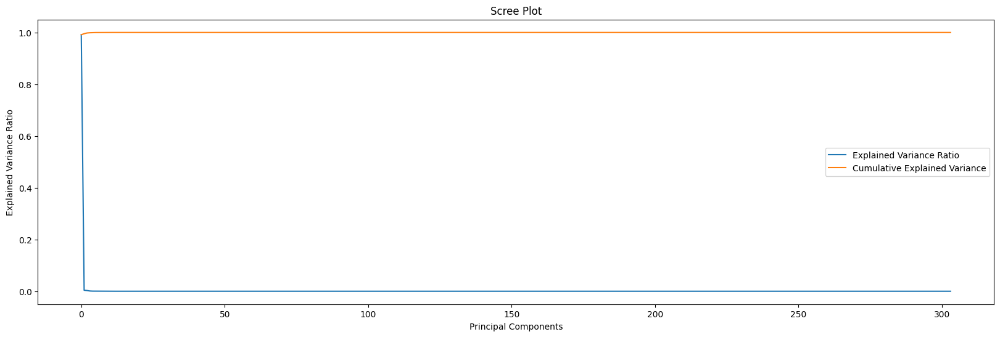

Number of PC needed to cover 99.9% of the dataset: 5


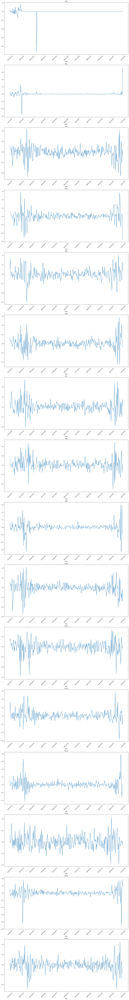

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

#1
cov_matrix = std_df.cov()
print("Shape of Covariance Matrix:" , cov_matrix.shape)


#2
def get_sorted_eigen(cov_mat):
    eigenvalues, eigenvectors = np.linalg.eigh(cov_mat)
    dec_i = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[dec_i]
    eigenvectors = eigenvectors[:,dec_i]
    return eigenvalues, eigenvectors


#3
eigenvalues, eigenvectors = get_sorted_eigen(cov_matrix)

explained_var_ratio = eigenvalues / eigenvalues.sum()
cumulative_explained_var = np.cumsum(explained_var_ratio)

plt.figure(figsize=(20, 6))
plt.plot(explained_var_ratio, label='Explained Variance Ratio')
plt.plot(cumulative_explained_var, label='Cumulative Explained Variance')
plt.title('Scree Plot')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.legend(loc='best')
plt.show()


#4
num_PC_needed = np.where(cumulative_explained_var >= 0.999)[0][0] + 1
print("Number of PC needed to cover 99.9% of the dataset:", num_PC_needed)


#5
fig, axs = plt.subplots(16,1,figsize=(20, 16*10))

x = list(std_df.columns)
axs = axs.flatten()
for i in range(16):
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
    axs[i].xaxis.set_major_locator(mdates.AutoDateLocator())
    axs[i].plot(x,eigenvectors[i])

    axs[i].set_title(f'PC{i+1}')
    axs[i].set_xlabel("Date")

    for label in axs[i].get_xticklabels():
        label.set_rotation(45)

plt.show()



Compare the first few PCs with the rest of them. Do you see any difference in their trend?

The first 2 PCs have a similar trend of high y std values at the beginning, which starts with a little bit of noise and then stays at 0 for little to no noise, and at the end, it experiences a sudden drop. The other PCs are significantly more noisy than the first parts. This shows that the first two PCs have the most significant variation in the data; as the number of PCs increases, the PC's significance decreases, making the plots more noisy. From the Scree Plot, it could be noticed that the first few PCs had the majority of significance (based on the Expalianed Variance Ratio's sudden drop near the beginning)


# Part 3: Data reconstruction [4.5 Marks]

Create a function that:

*   Accepts a family and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues.
*   Plots 4 figures:
  1.   The original time-series for the specified family. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified family in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable):
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[1]**
      * Hint: You are plotting the error that we have for reconstructing each day `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error.
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `POULTRY`, `GROCERY I`, `SCHOOL AND OFFICE SUPPLIES`, `CELEBRATION`, `LAWN AND GARDEN`, and `FROZEN FOODS` as inputs. **[0.5]**


In [25]:
from sklearn.metrics import mean_squared_error

def plot_family_figures(original_df, family_name):
  #1
  y=list(original_df.loc[family_name])
  x = original_df.columns

  plt.figure(figsize=(16, 8))
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
  plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
  plt.plot(x,y)
  plt.xticks(rotation=45)
  plt.xlabel("Date")
  plt.title(f"Original time-series for {family_name}")
  plt.show()



  #2
  scaler = StandardScaler()
  standardized_data = scaler.fit_transform(original_df)
  std_df = pd.DataFrame(standardized_data, columns=original_df.columns)
  std_df.index = original_df.index

  cov_matrix = std_df.cov()
  _, eigenvectors = get_sorted_eigen(cov_matrix)

  plt.figure(figsize=(16, 8))
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
  plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())

  inc_lst = [1,2,4,5,8,16]
  recon_dfs = []
  for i in inc_lst:
    W = eigenvectors[:,0:i]
    projX = np.dot(std_df, W)
    Recon = scaler.inverse_transform(np.dot(projX, W.T))
    Recon_df = pd.DataFrame(Recon,columns=original_df.columns, index = original_df.index)
    recon_dfs.append(Recon_df.loc[family_name])
    plt.plot(Recon_df.loc[family_name], label=f"PC 1 to PC{i}")

  plt.title(f"Reconstructed time-series for {family_name}")
  plt.legend(loc='best')
  plt.xticks(rotation=45)
  plt.xlabel("Date")
  plt.show()



  #3
  mse_values = [mean_squared_error(original_df.loc[family_name], recon_df) for recon_df in recon_dfs]
  Best_res_err_i = np.argmin(mse_values)
  res_error =original_df.loc[family_name] - recon_dfs[Best_res_err_i]

  plt.figure(figsize=(16, 8))
  plt.plot(x,res_error,label=f"PC 1 to PC{inc_lst[Best_res_err_i]}")
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
  plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
  plt.legend(loc='best')
  plt.xticks(rotation=45)
  plt.title(f"Best Residual Error for {family_name}")
  plt.ylabel("Residual Error")
  plt.xlabel("Date")
  plt.show()



  #4
  rmse_errs =[]
  for i in range(10):
    W = eigenvectors[:,0:i]
    projX = np.dot(std_df, W)
    Recon = scaler.inverse_transform(np.dot(projX, W.T))
    Recon_df = pd.DataFrame(Recon,columns=original_df.columns, index = original_df.index)
    rmse_errs.append(mean_squared_error(original_df.loc[family_name], Recon_df.loc[family_name], squared =True))


  plt.figure(figsize=(16, 8))
  plt.plot(range(1,11), rmse_errs)
  plt.title(f"RSME for {family_name}")
  plt.xlabel("Number of PCs")
  plt.ylabel("RMSE")
  plt.show()


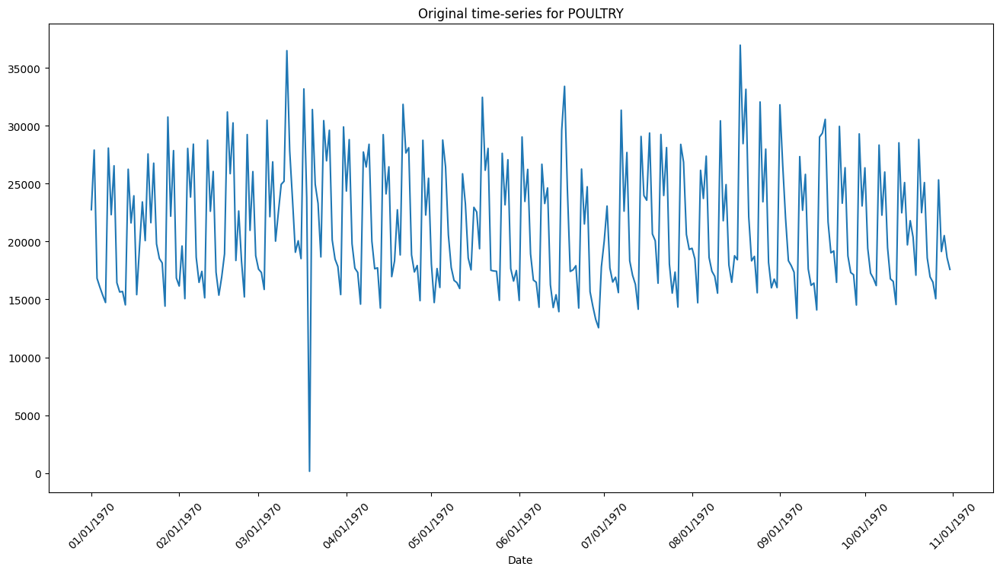

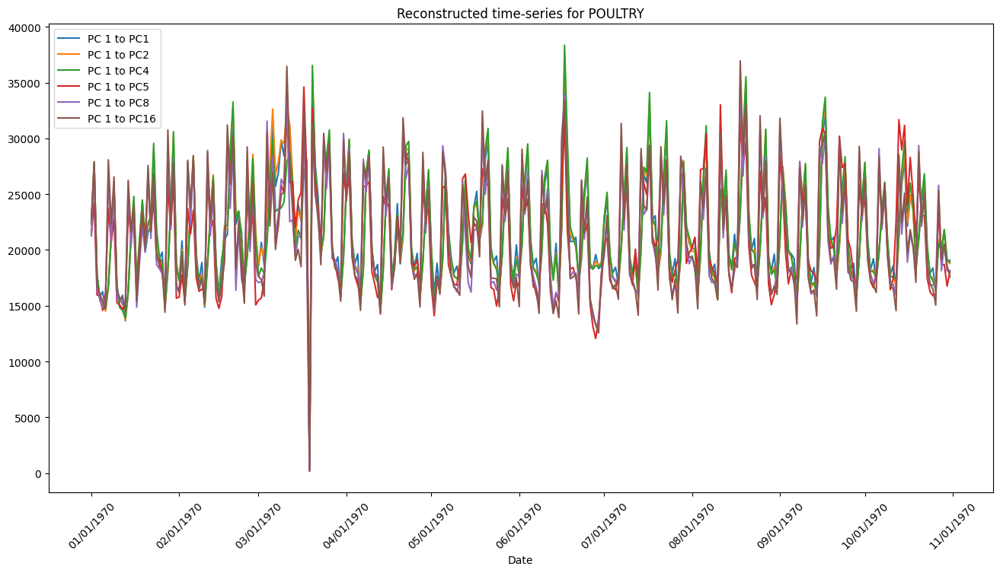

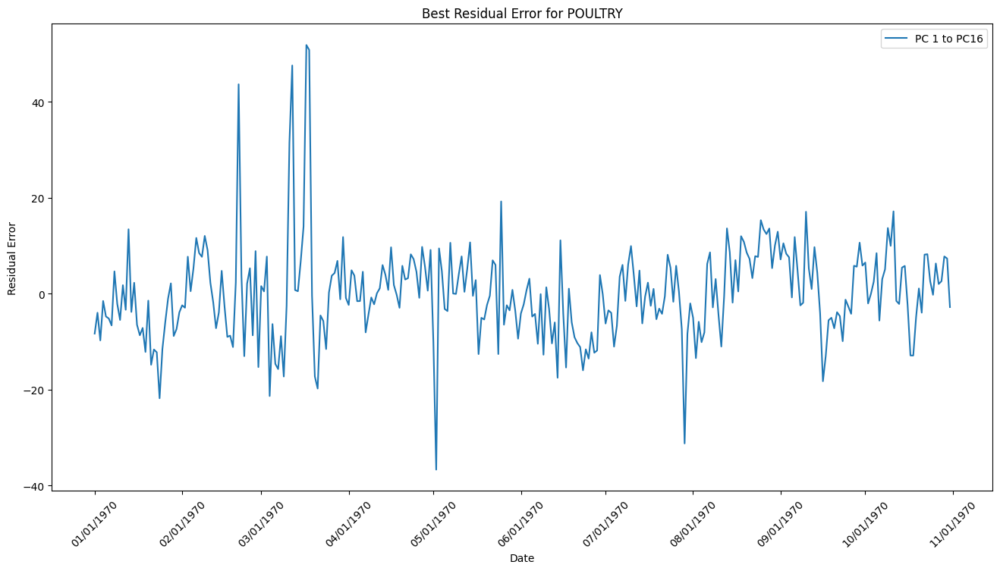

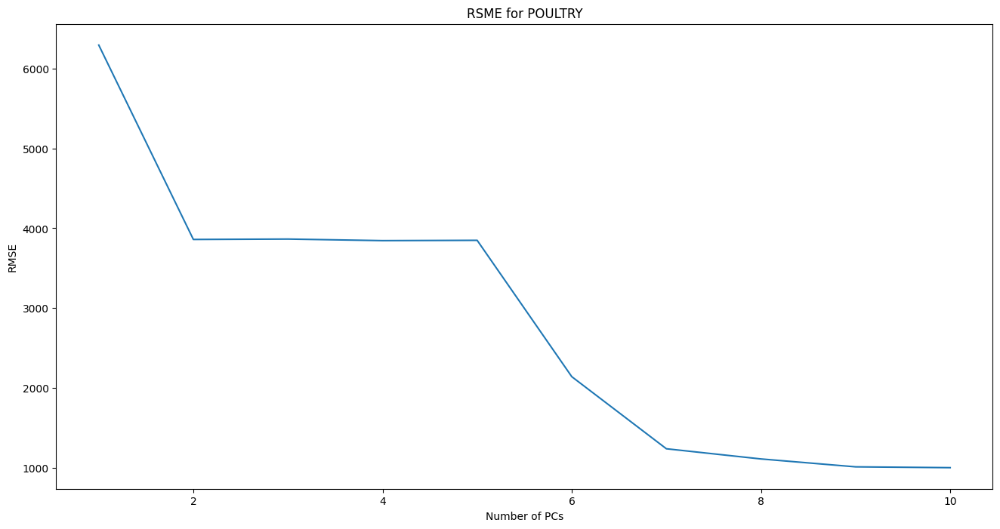

In [ ]:
plot_family_figures(data_raw, "POULTRY")

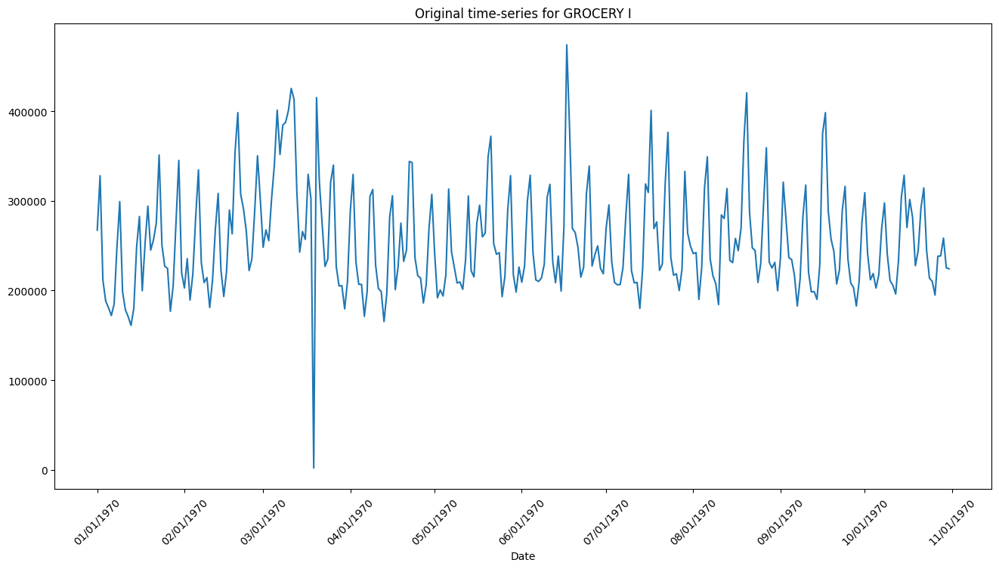

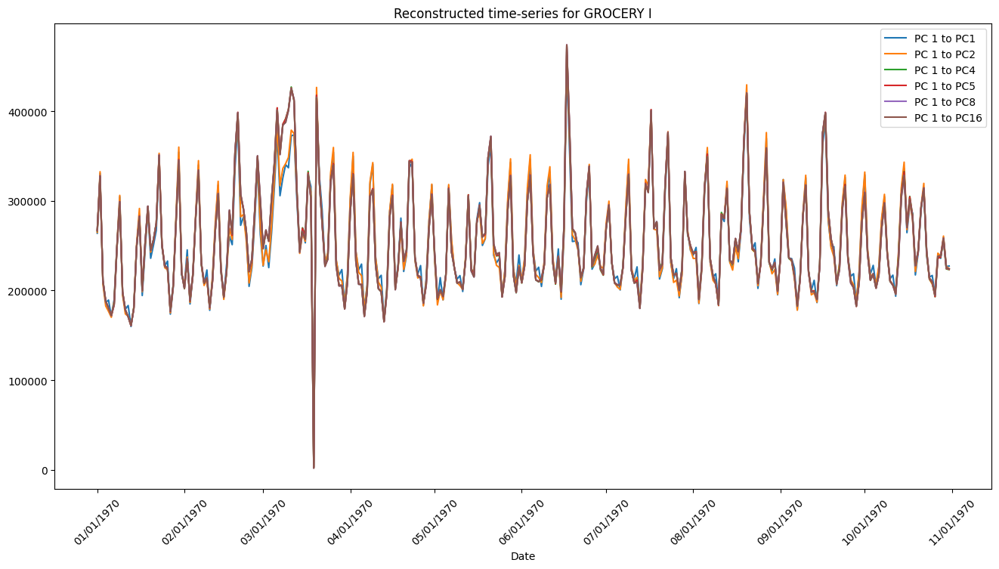

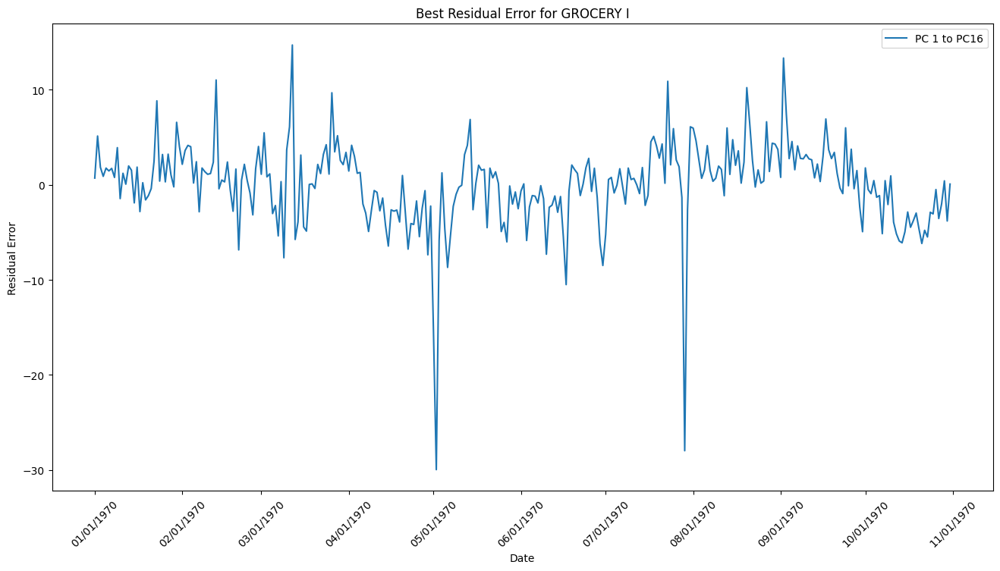

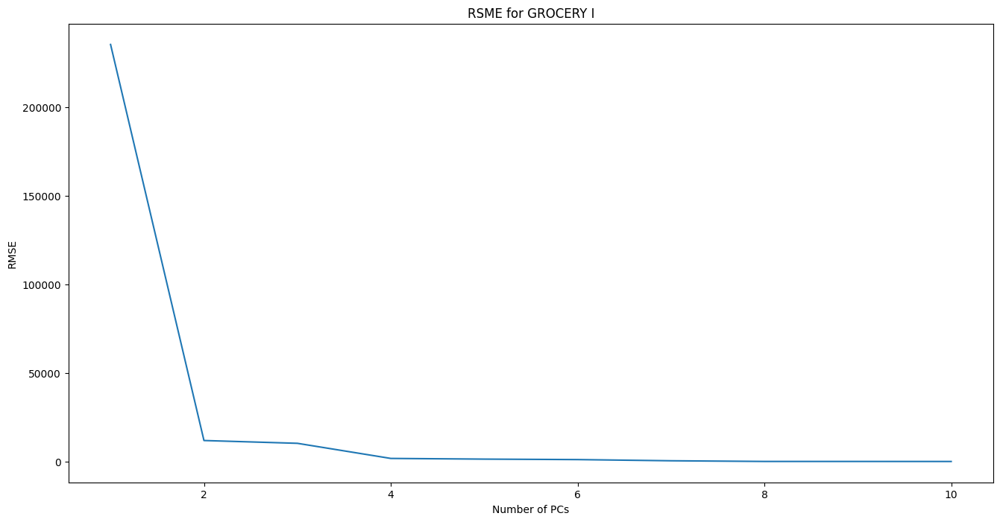

In [ ]:
plot_family_figures(data_raw, "GROCERY I")

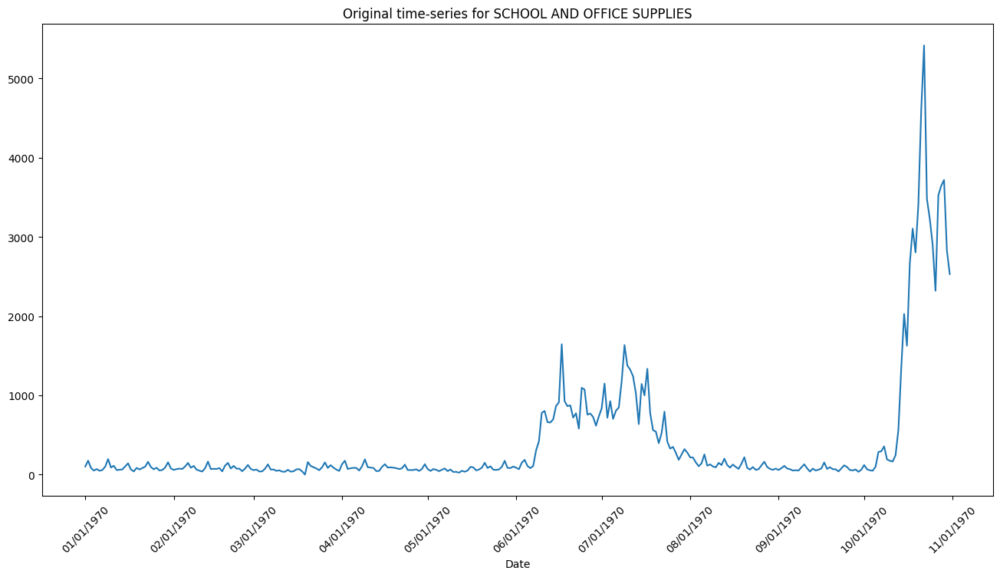

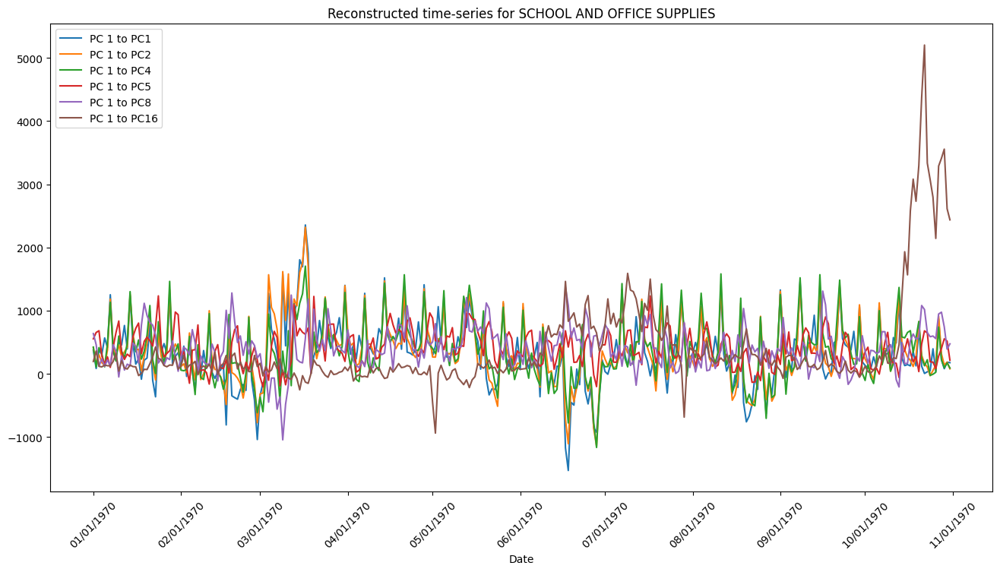

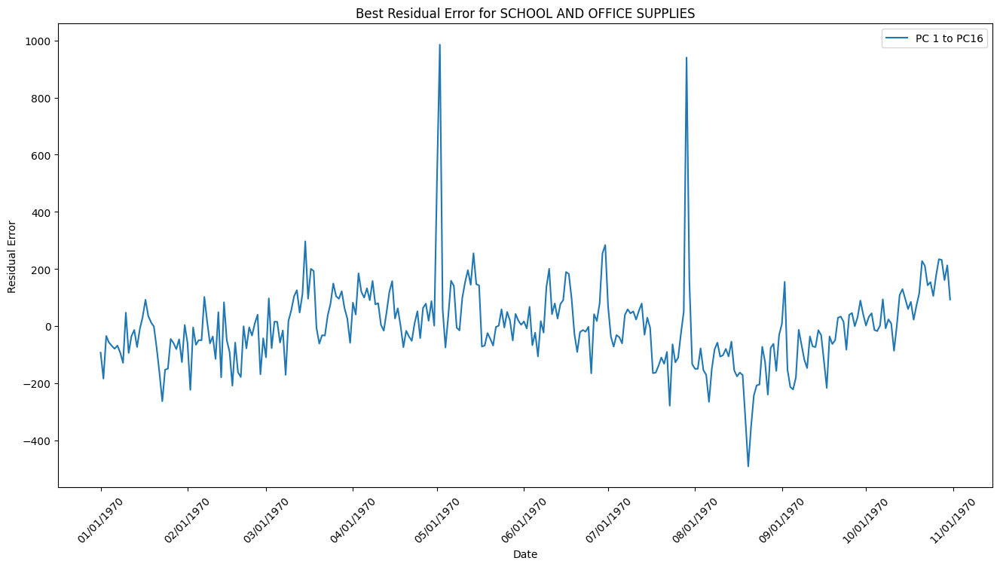

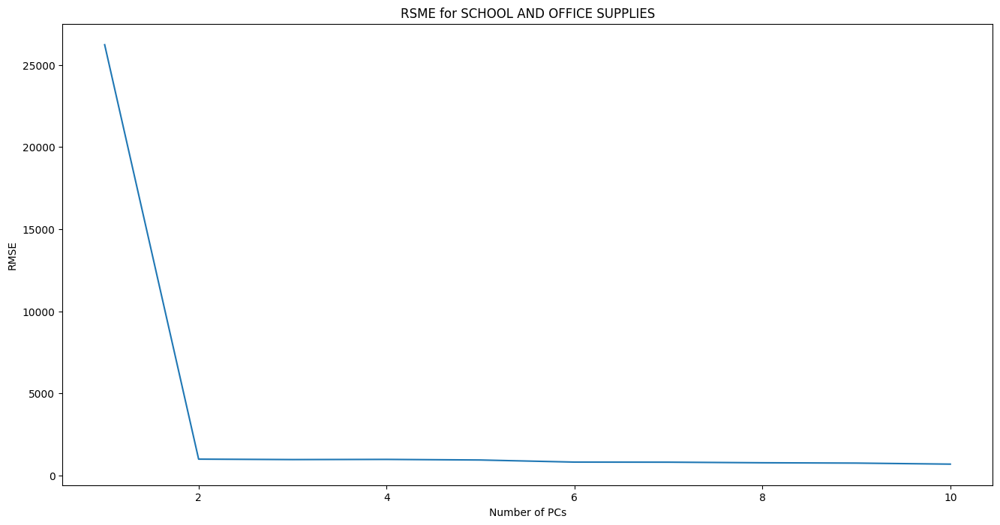

In [ ]:
plot_family_figures(data_raw, "SCHOOL AND OFFICE SUPPLIES")

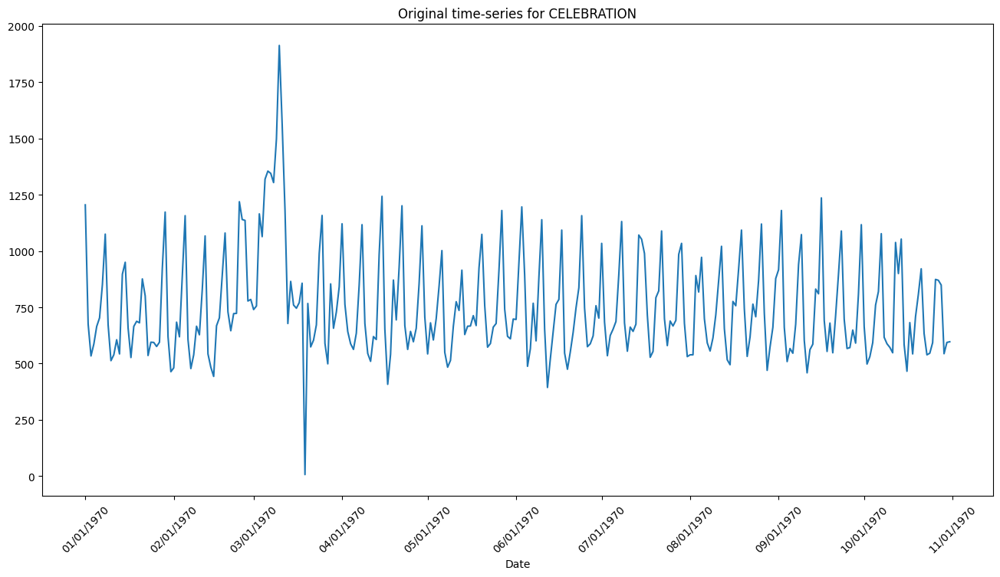

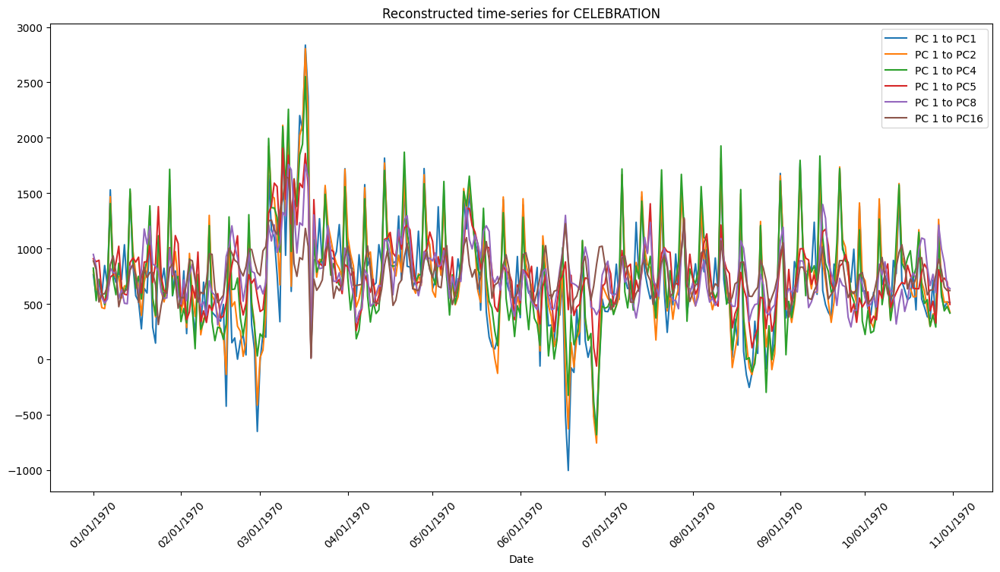

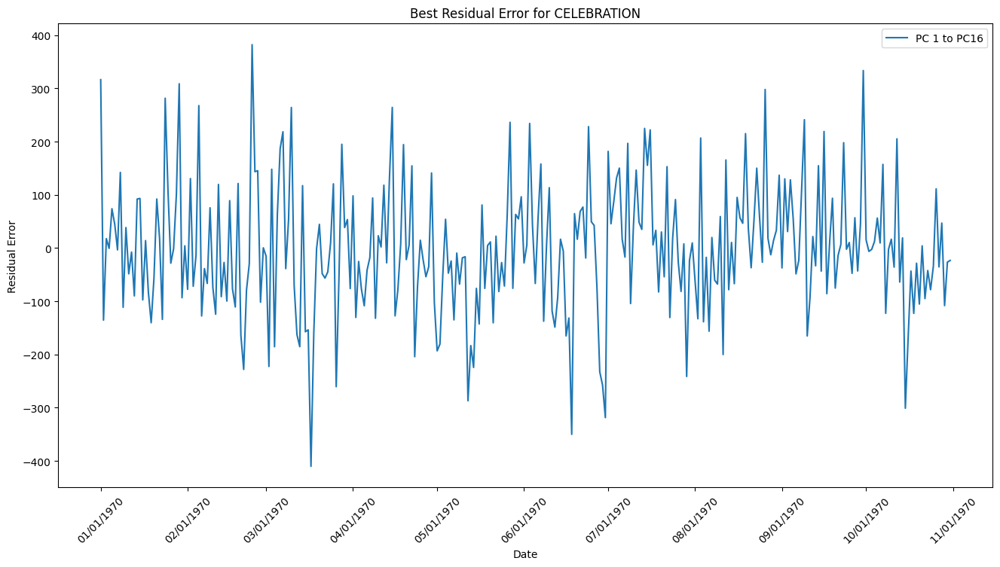

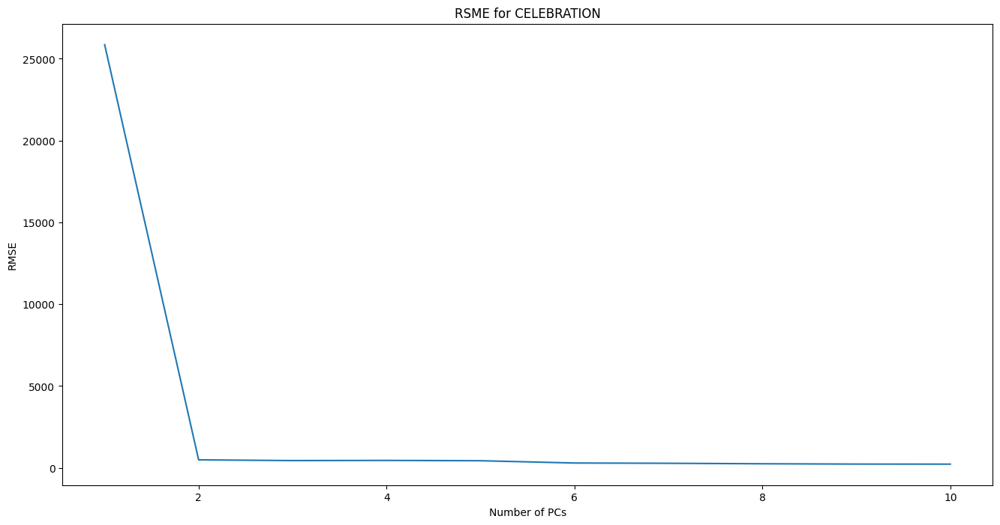

In [ ]:
plot_family_figures(data_raw, "CELEBRATION")

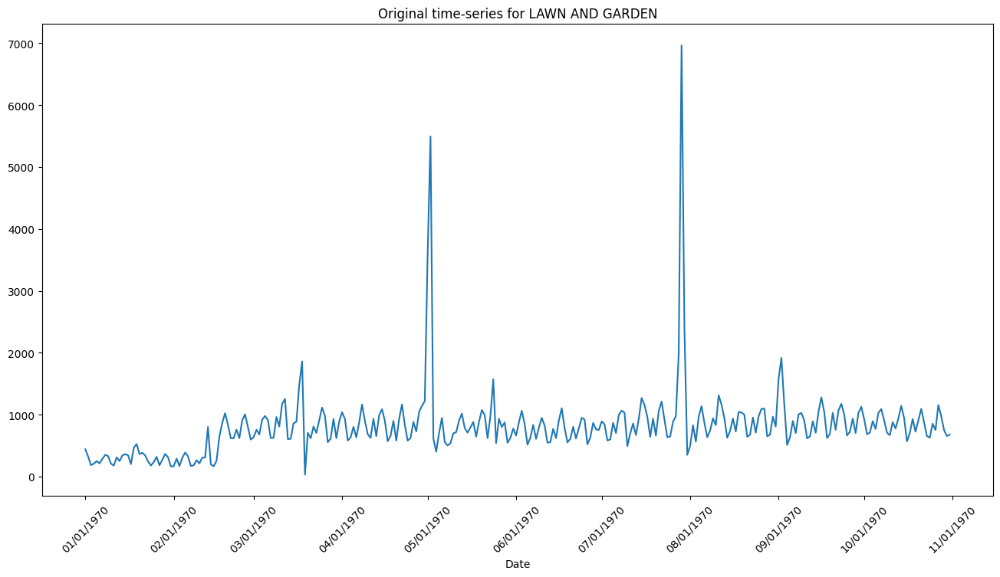

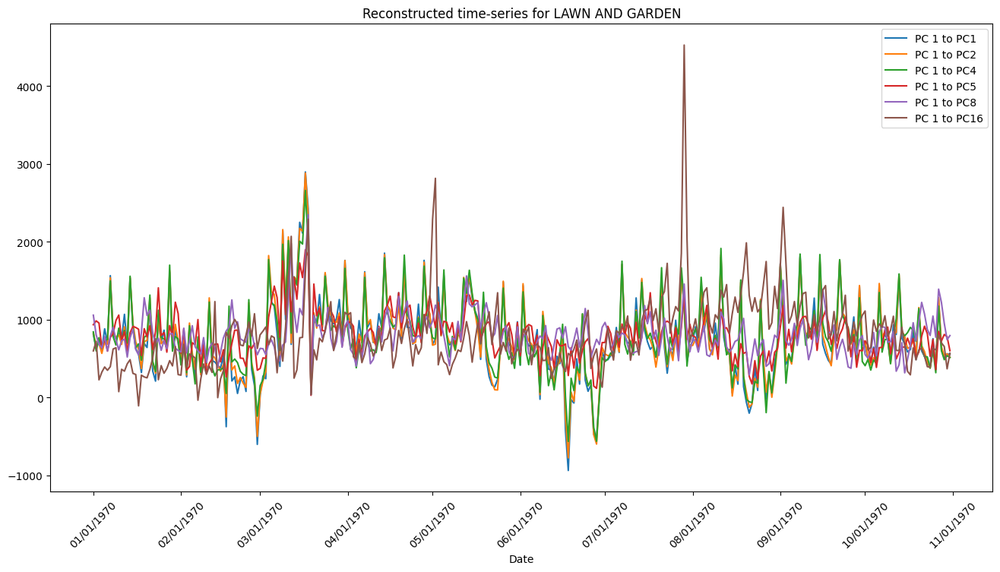

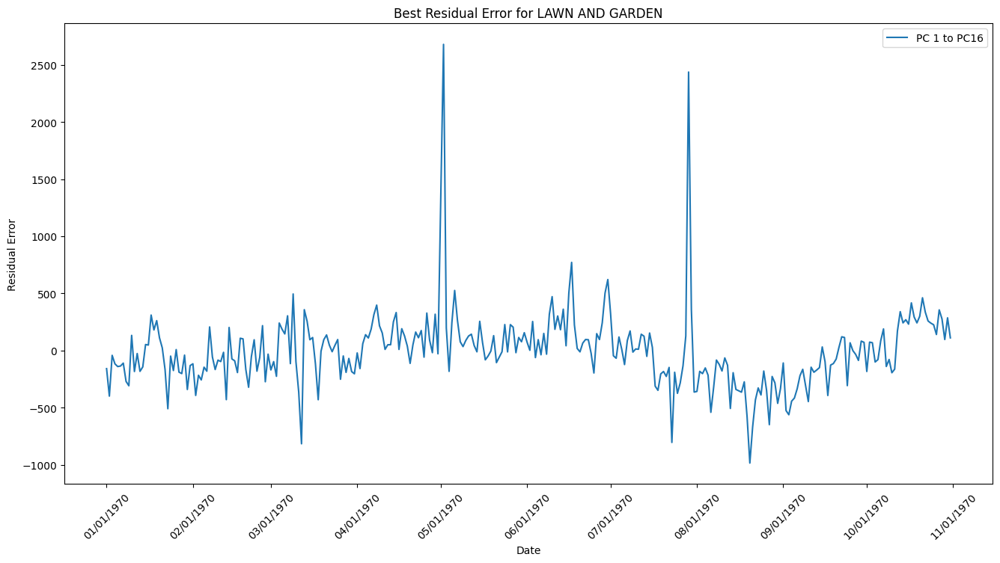

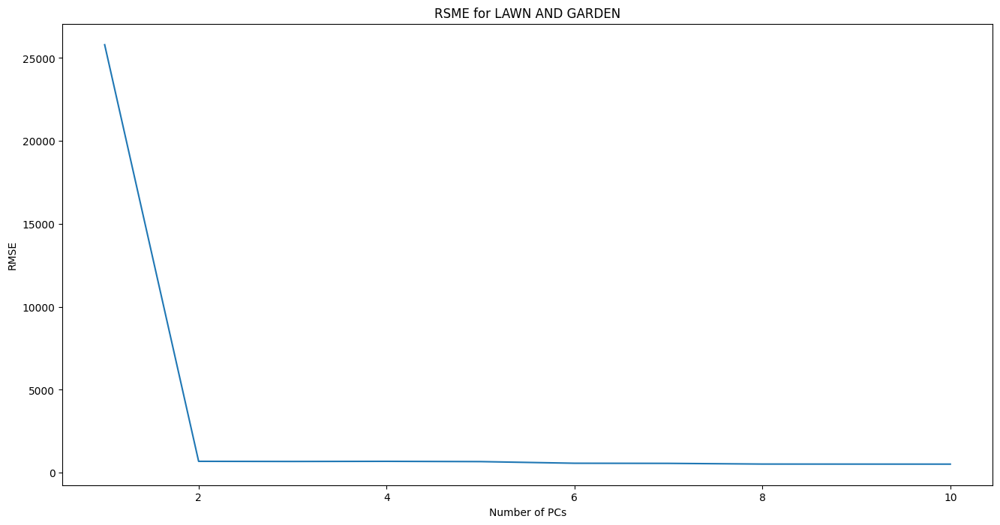

In [ ]:
plot_family_figures(data_raw, "LAWN AND GARDEN")

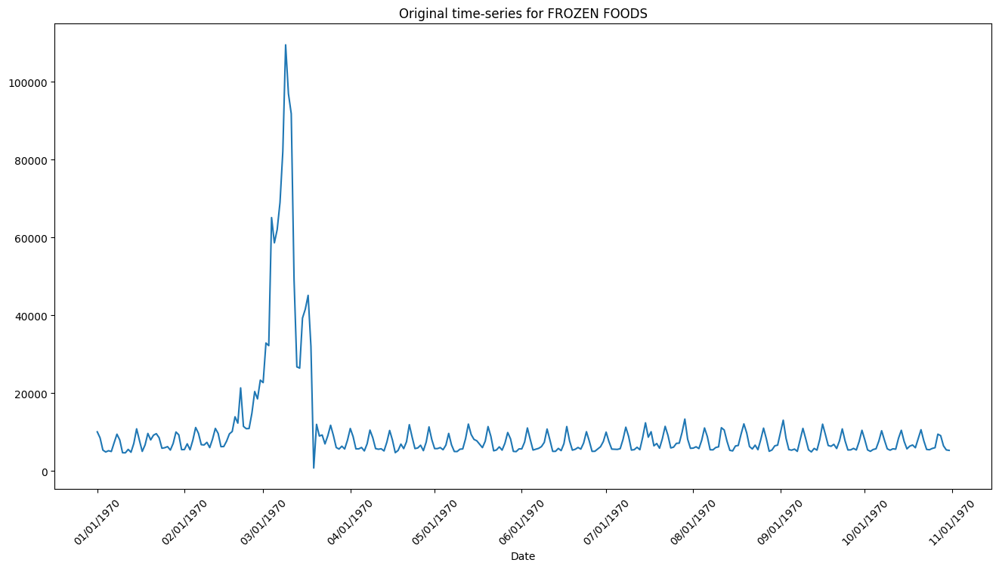

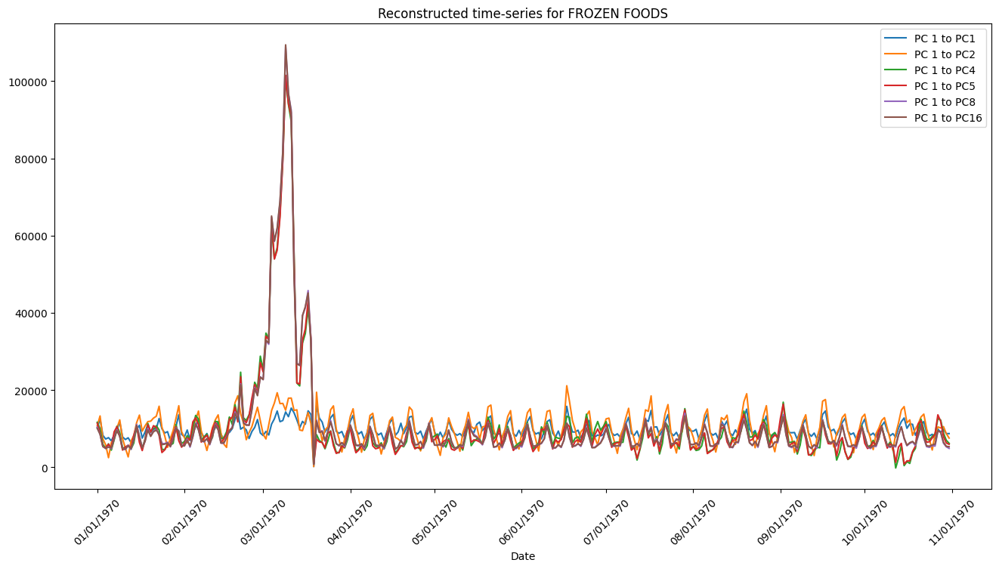

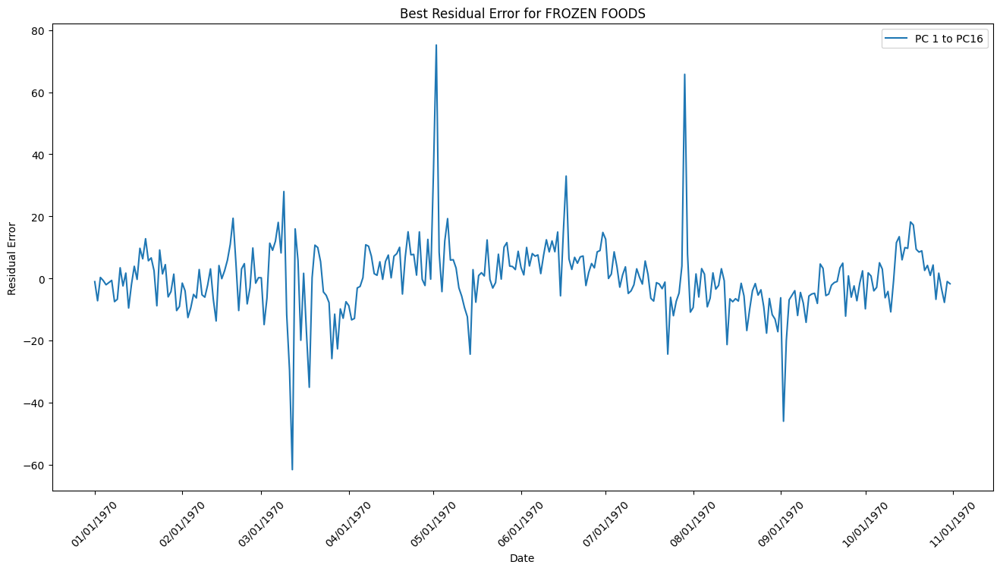

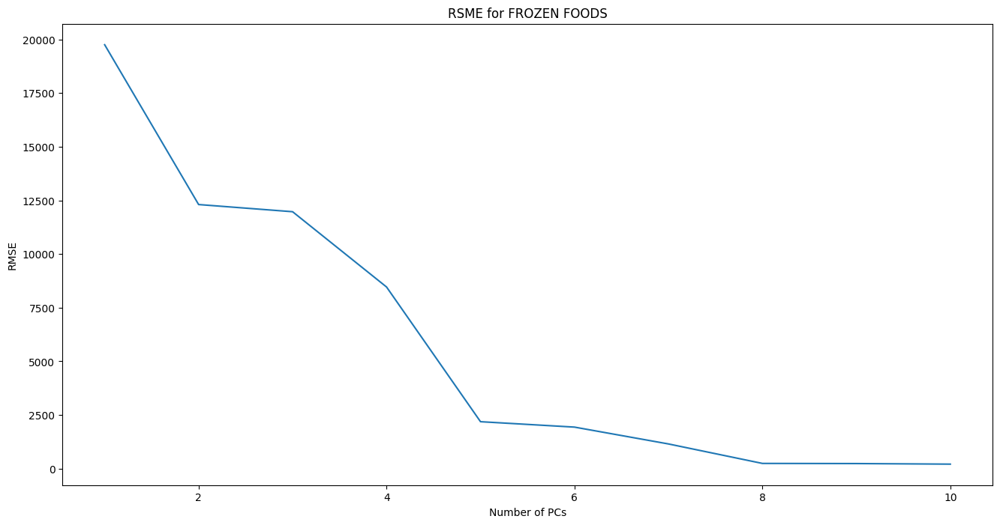

In [ ]:
plot_family_figures(data_raw, "FROZEN FOODS")

# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

In [27]:
from sklearn.metrics import mean_squared_error

def SVD_PCA_CMP(original_df, family_name):
  #1
  y=list(original_df.loc[family_name])
  x = original_df.columns

  plt.figure(figsize=(16, 8))
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
  plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
  plt.plot(x,y)
  plt.xticks(rotation=45)
  plt.xlabel("Date")
  plt.title(f"Original time-series for {family_name}")
  plt.show()



  #2
  scaler = StandardScaler()
  standardized_data = scaler.fit_transform(original_df)
  std_df = pd.DataFrame(standardized_data, columns=original_df.columns)
  std_df.index = original_df.index

  cov_matrix = std_df.cov()
  _, eigenvectors = get_sorted_eigen(cov_matrix)

  plt.figure(figsize=(16, 8))
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
  plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())

  inc_lst = [1,2,4,5,8,16]

  ##SVD##
  U, S, V = np.linalg.svd(original_df)


  recon_dfs_SVD = []
  recon_dfs_PCA = []
  for i in inc_lst:
    ##SVD##
    U_truncated = U[:, :i]
    S_truncated = np.diag(S[:i])
    V_truncated = V[:i, :]
    recon_data_SVD = U_truncated.dot(S_truncated).dot(V_truncated)
    Recon_df_SVD = pd.DataFrame(recon_data_SVD,columns=original_df.columns, index = original_df.index)
    recon_dfs_SVD.append(Recon_df_SVD.loc[family_name])
    plt.plot(Recon_df_SVD.loc[family_name], label=f"elements 1 to {i}")


    ##PCA##
    W = eigenvectors[:,0:i]
    projX = np.dot(std_df, W)
    recon_data_PCA = scaler.inverse_transform(np.dot(projX, W.T))
    Recon_df_PCA = pd.DataFrame(recon_data_PCA,columns=original_df.columns, index = original_df.index)
    recon_dfs_PCA.append(Recon_df_PCA.loc[family_name])
    plt.plot(Recon_df_PCA.loc[family_name], label=f"PC 1 to PC{i}")


  plt.title(f"Reconstructed time-series for {family_name} | SVD vs PCA")
  plt.legend(loc='best')
  plt.xticks(rotation=45)
  plt.xlabel("Date")
  plt.show()



  #3
  ##SVD##
  mse_values_SVD = [mean_squared_error(original_df.loc[family_name], recon_df) for recon_df in recon_dfs_SVD]
  Best_res_err_i_SVD = np.argmin(mse_values_SVD)
  res_error_SVD =original_df.loc[family_name] - recon_dfs_SVD[Best_res_err_i_SVD]

  ##PCA##
  mse_values_PCA = [mean_squared_error(original_df.loc[family_name], recon_df) for recon_df in recon_dfs_PCA]
  Best_res_err_i_PCA = np.argmin(mse_values_PCA)
  res_error_PCA =original_df.loc[family_name] - recon_dfs_PCA[Best_res_err_i_PCA]


  plt.figure(figsize=(16, 8))
  plt.plot(x,res_error_SVD,label=f"elements 1 to elements{inc_lst[Best_res_err_i_SVD]}")
  plt.plot(x,res_error_PCA,label=f"PC 1 to PC{inc_lst[Best_res_err_i_PCA]}")
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d/%Y'))
  plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
  plt.legend(loc='best')
  plt.xticks(rotation=45)
  plt.title(f"Best Residual Error for {family_name} | SVD vs PCA")
  plt.ylabel("Residual Error")
  plt.xlabel("Date")
  plt.show()



  #4
  rmse_errs_PCA =[]
  rmse_errs_SVD =[]
  for i in range(10):
    ##SVD##
    U_truncated = U[:, :i]
    S_truncated = np.diag(S[:i])
    V_truncated = V[:i, :]
    recon_data_SVD = U_truncated.dot(S_truncated).dot(V_truncated)
    Recon_df_SVD = pd.DataFrame(recon_data_SVD,columns=original_df.columns, index = original_df.index)
    rmse_errs_SVD.append(mean_squared_error(original_df.loc[family_name], Recon_df_SVD.loc[family_name], squared=True))

    ##PCA##
    W = eigenvectors[:,0:i]
    projX = np.dot(std_df, W)
    recon_data_PCA = scaler.inverse_transform(np.dot(projX, W.T))
    Recon_df_PCA = pd.DataFrame(recon_data_PCA,columns=original_df.columns, index = original_df.index)
    rmse_errs_PCA.append(mean_squared_error(original_df.loc[family_name], Recon_df_PCA.loc[family_name], squared =True))


  plt.figure(figsize=(16, 8))
  plt.plot(range(1,11), rmse_errs_SVD, label="SVD")
  plt.plot(range(1,11), rmse_errs_PCA, label="PCA")
  plt.title(f"RSME for {family_name} | SVD vs PCA")
  plt.xlabel("Number of Elements")
  plt.ylabel("RMSE")
  plt.legend(loc='best')
  plt.show()



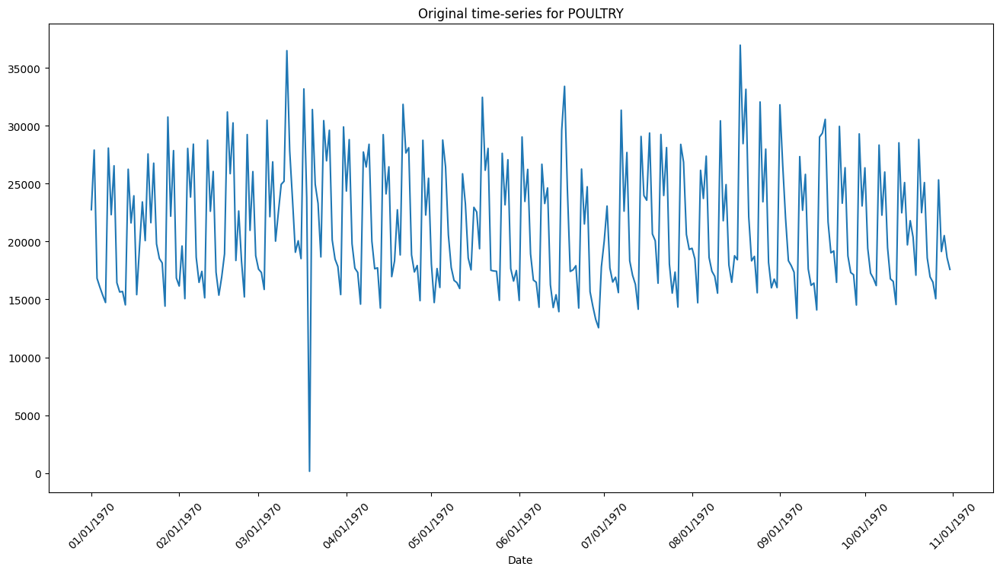

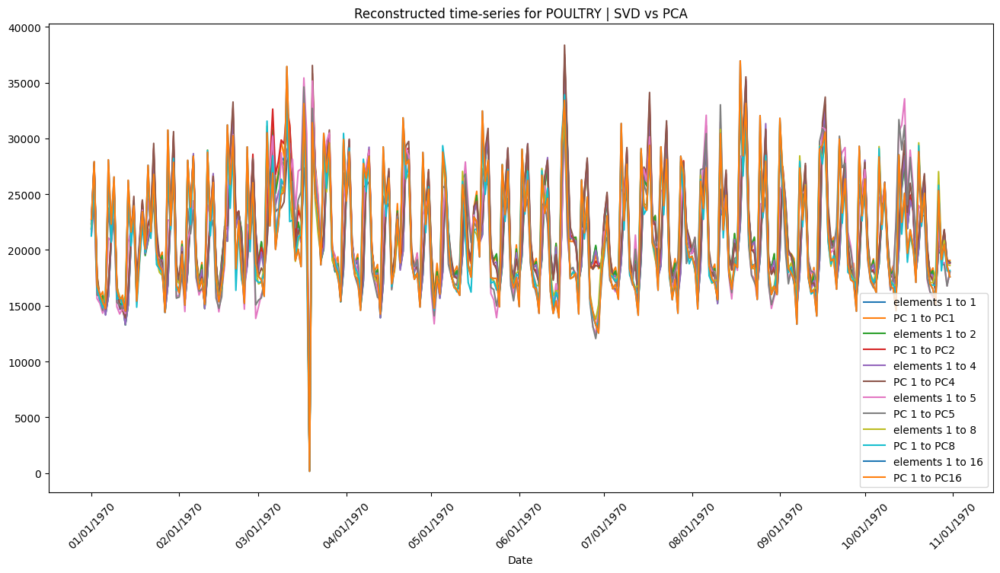

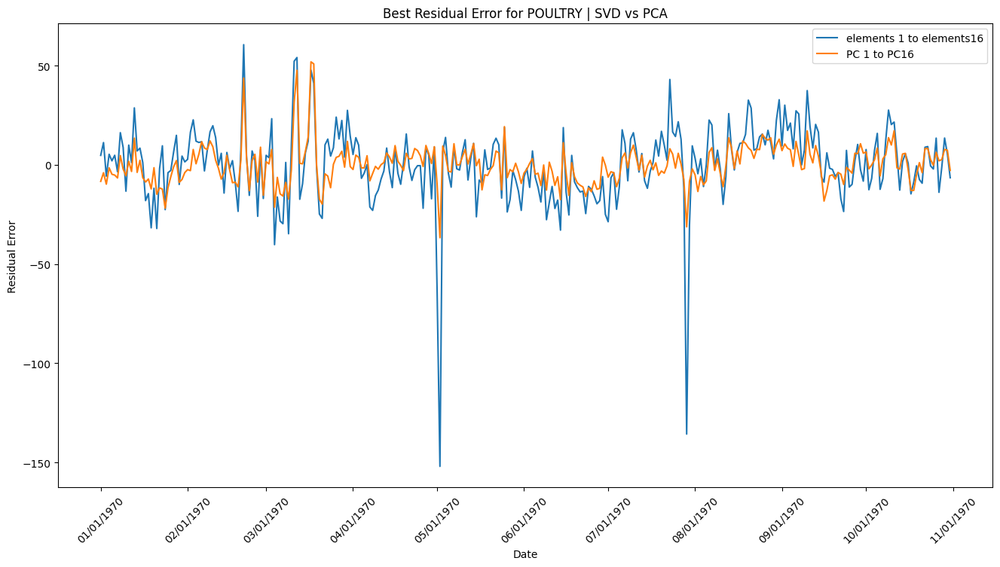

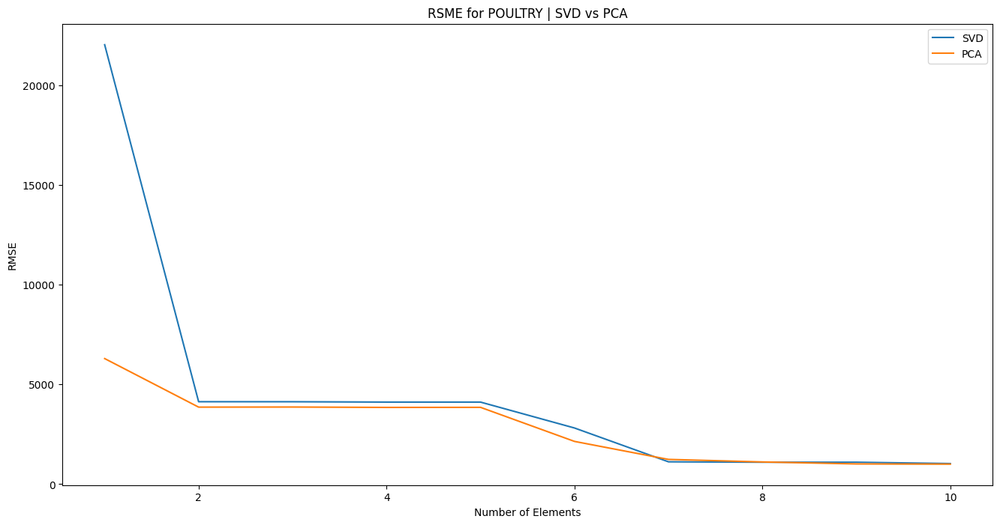

In [ ]:
SVD_PCA_CMP(data_raw, "POULTRY")

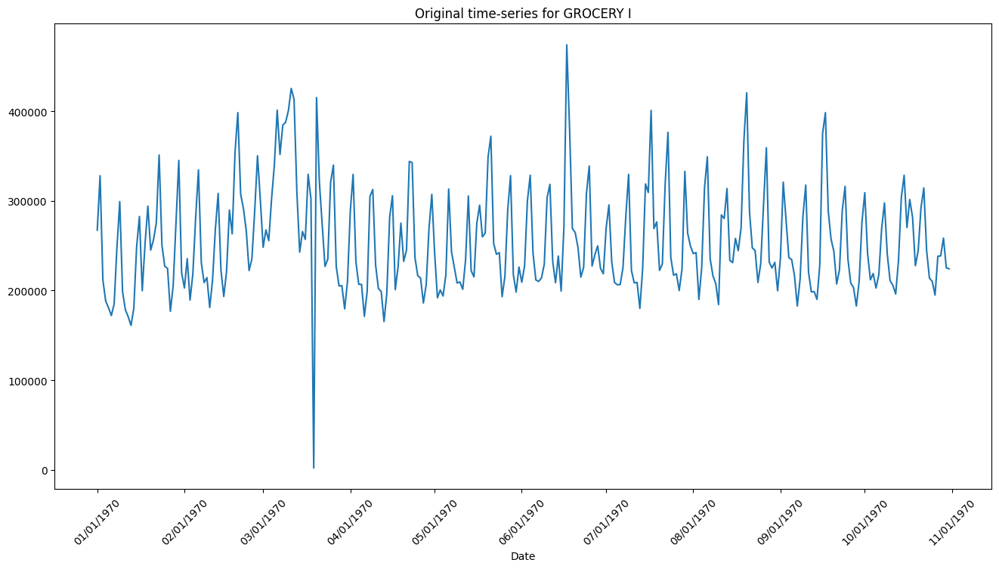

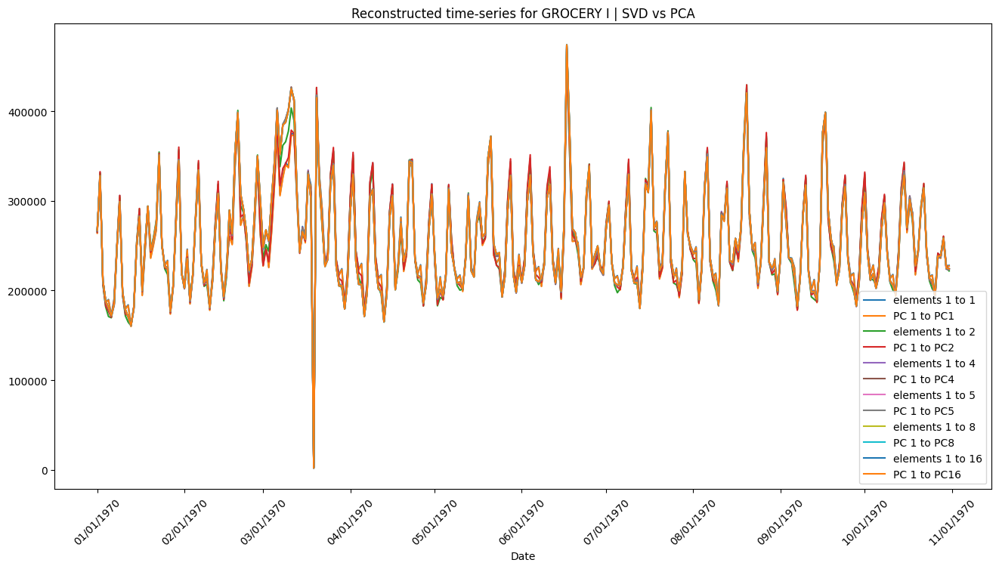

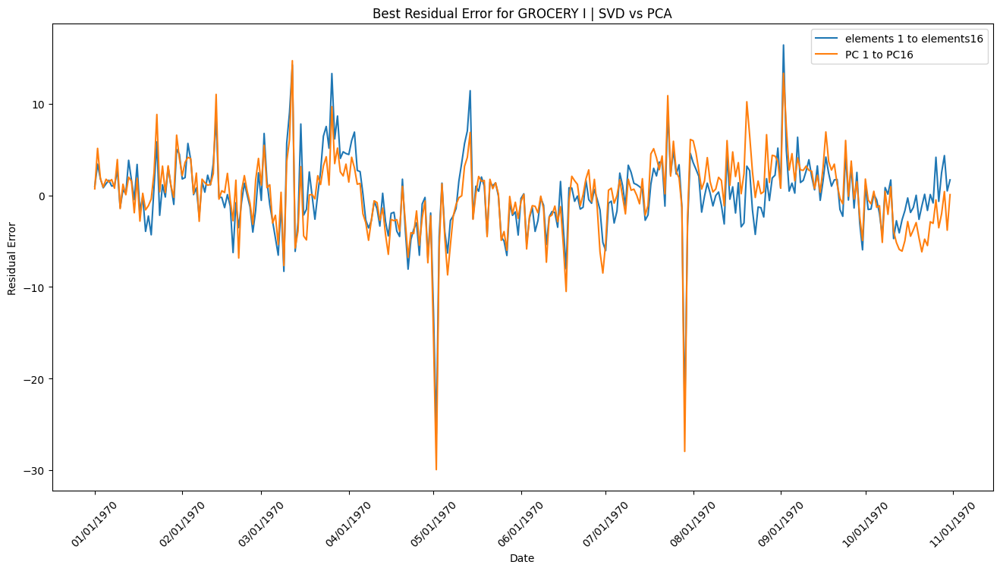

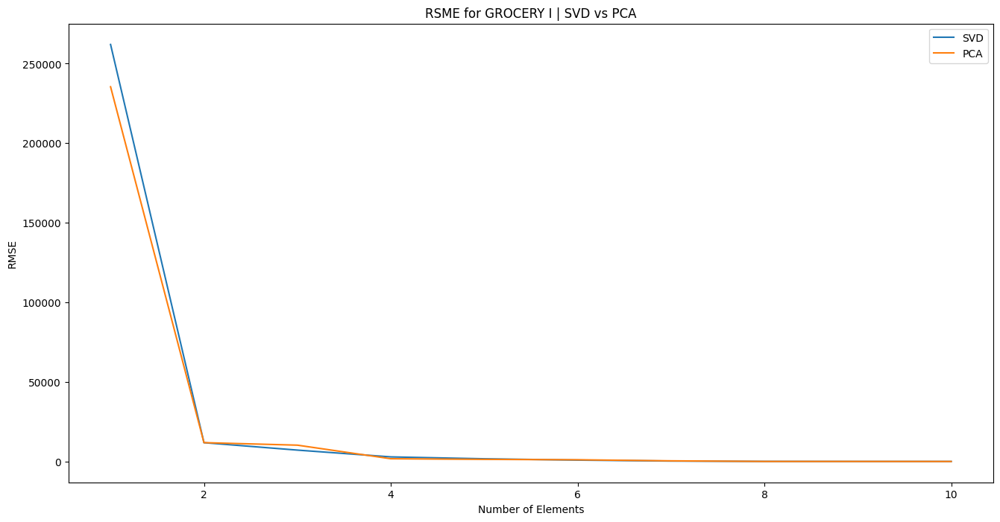

In [ ]:
SVD_PCA_CMP(data_raw, "GROCERY I")

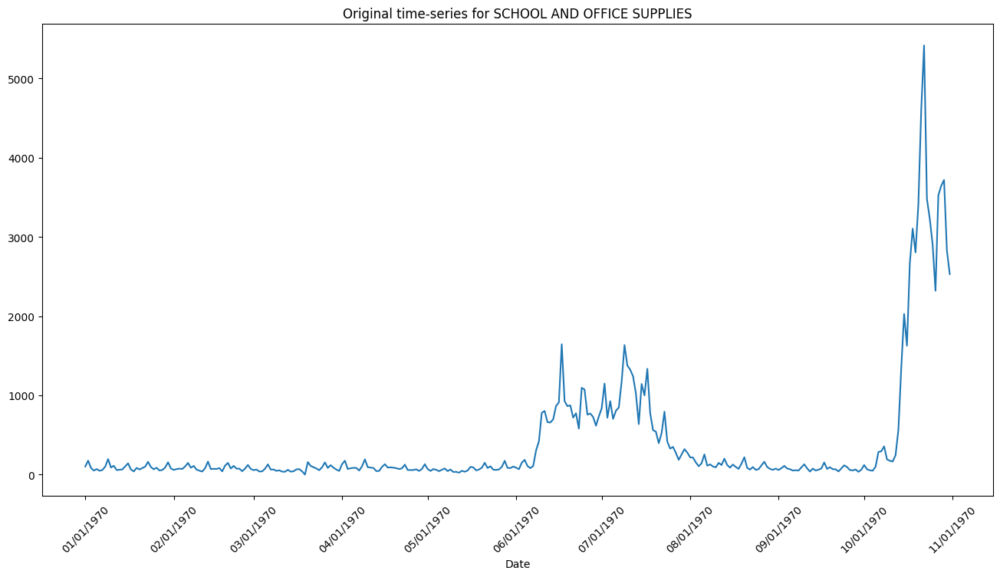

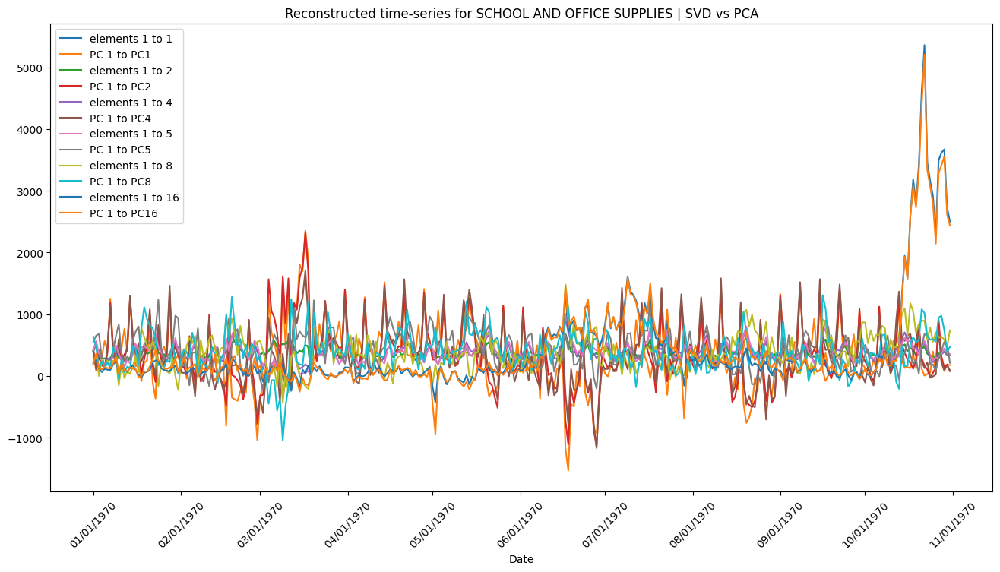

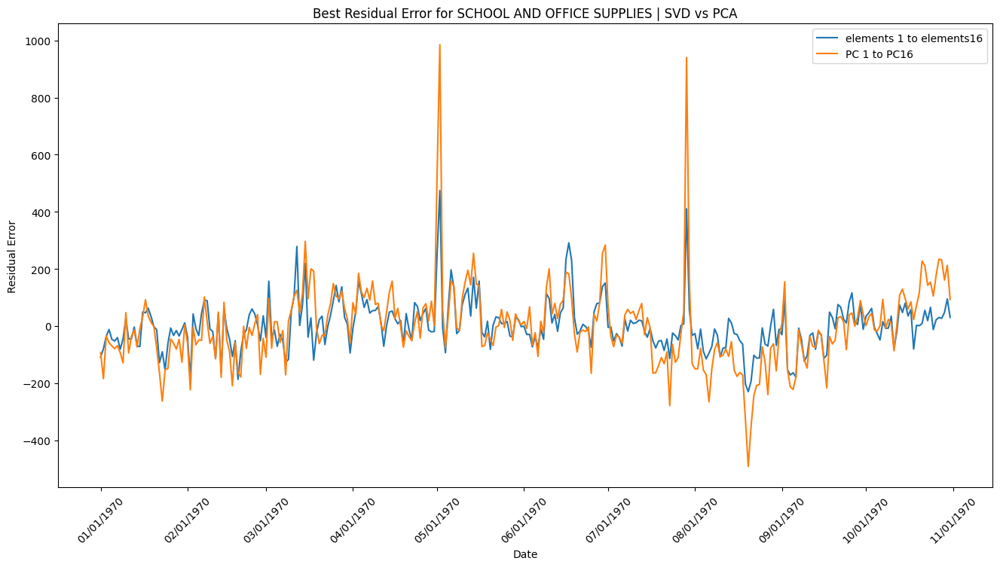

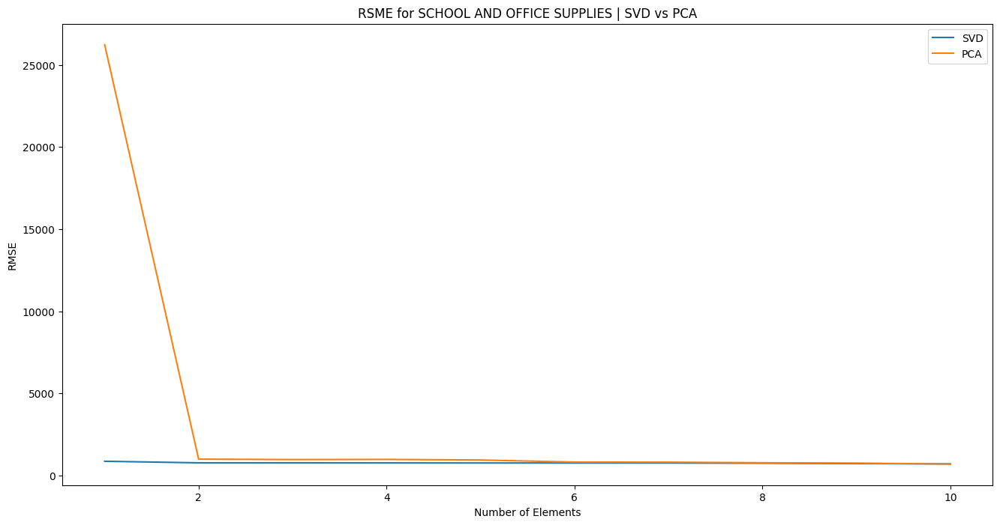

In [ ]:
SVD_PCA_CMP(data_raw, "SCHOOL AND OFFICE SUPPLIES")

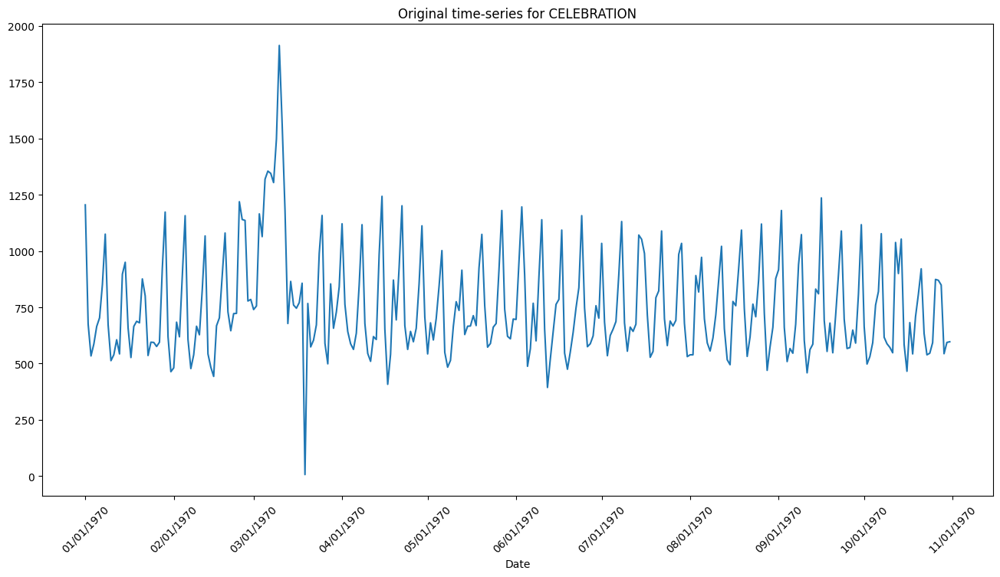

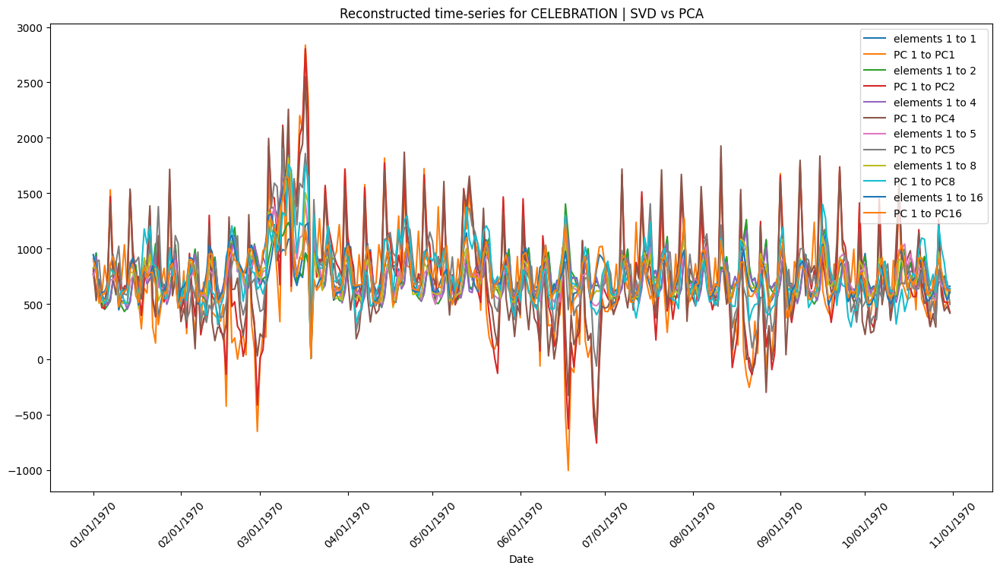

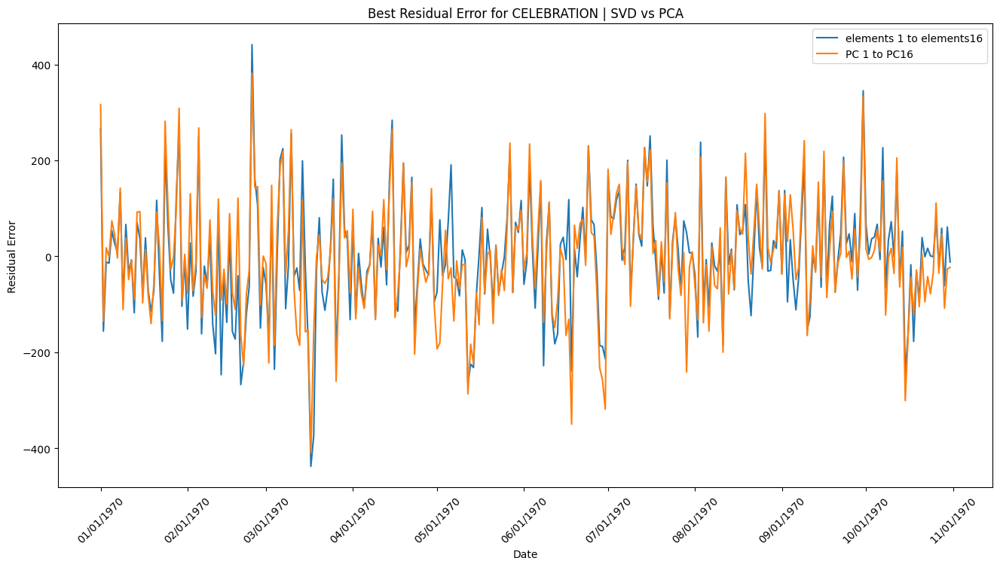

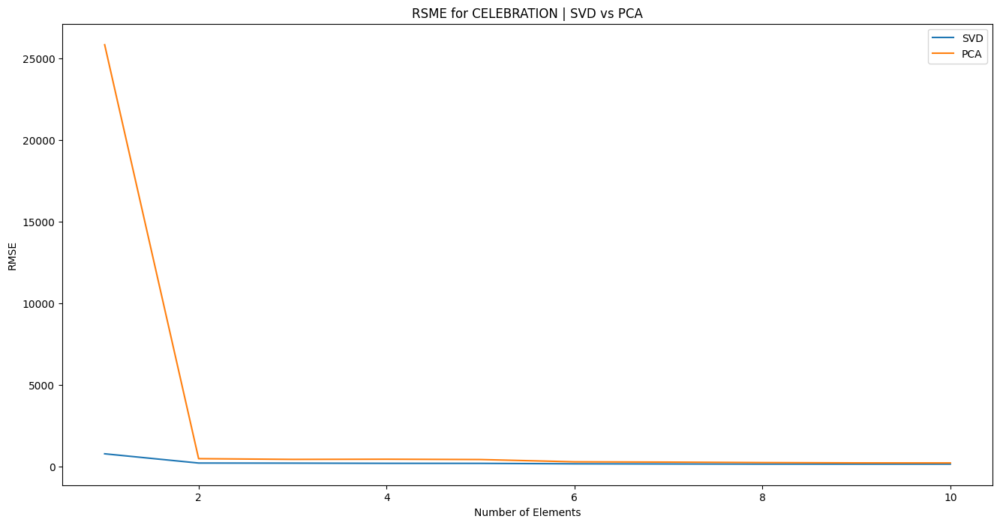

In [ ]:
SVD_PCA_CMP(data_raw, "CELEBRATION")

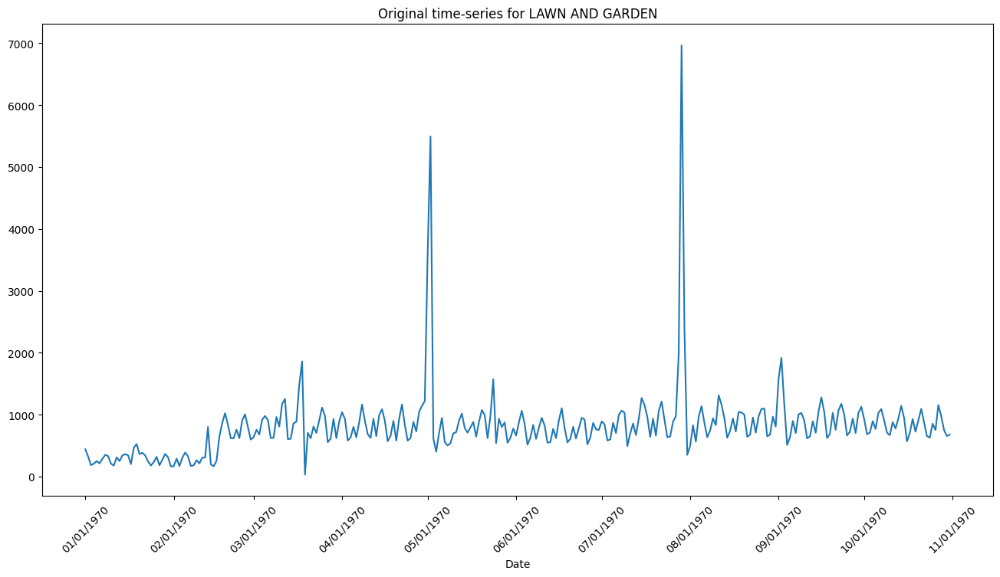

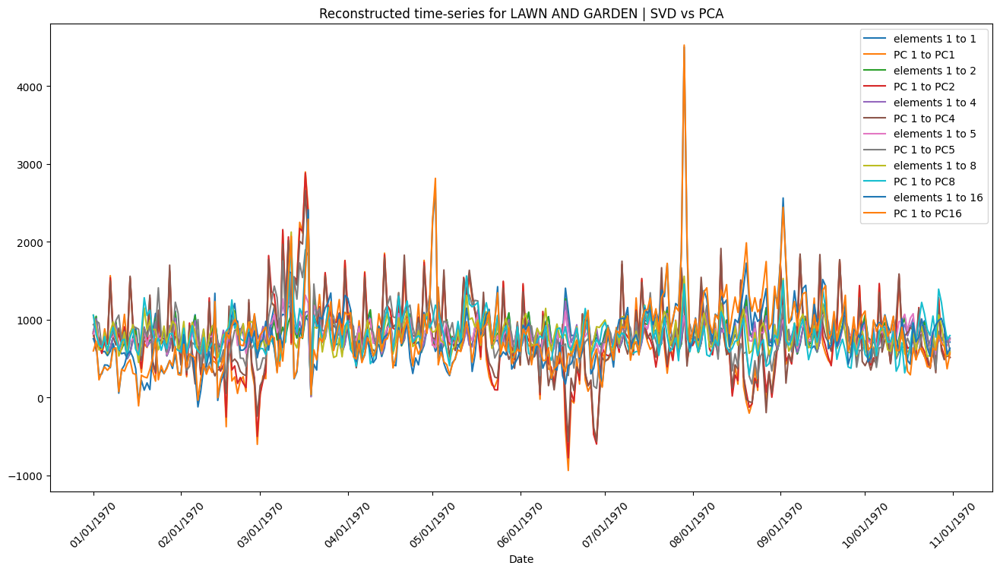

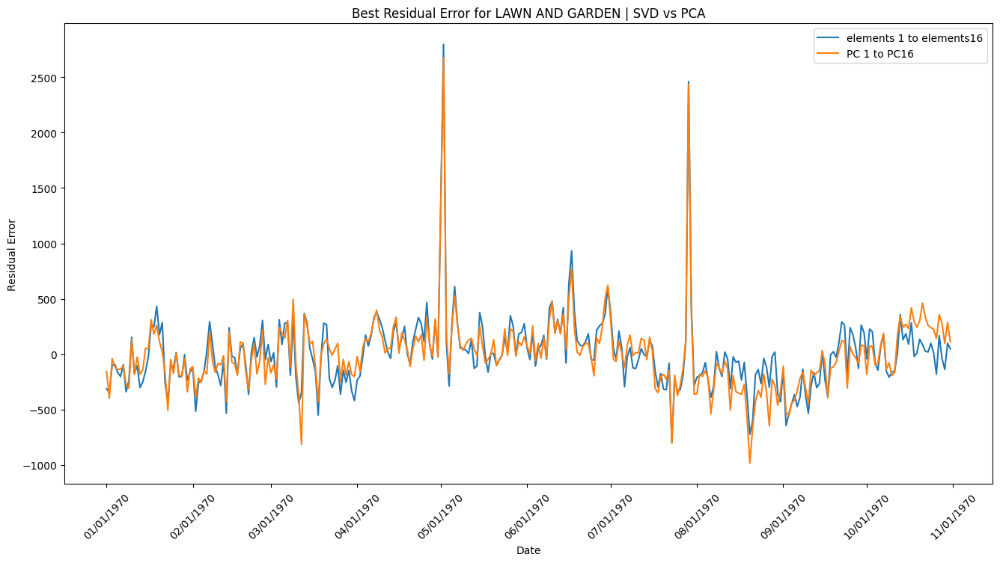

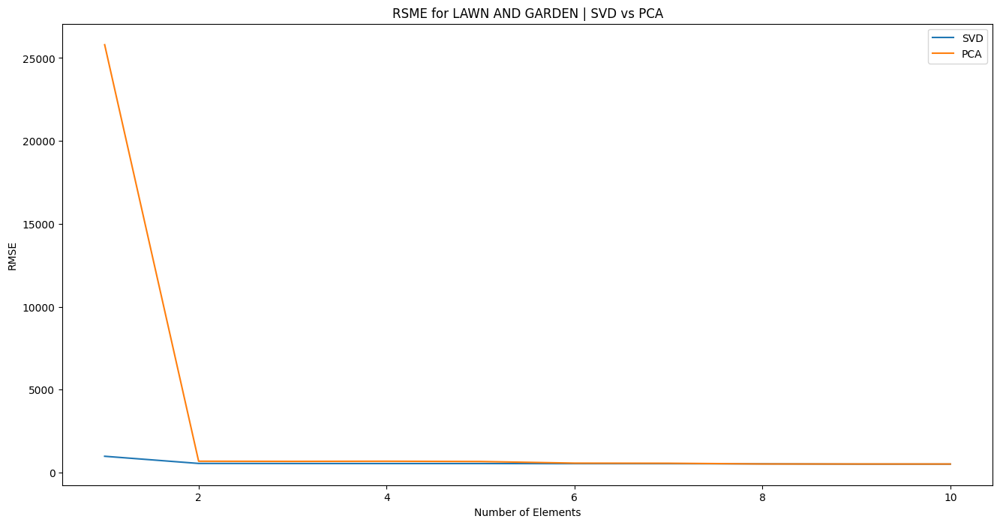

In [ ]:
SVD_PCA_CMP(data_raw, "LAWN AND GARDEN")

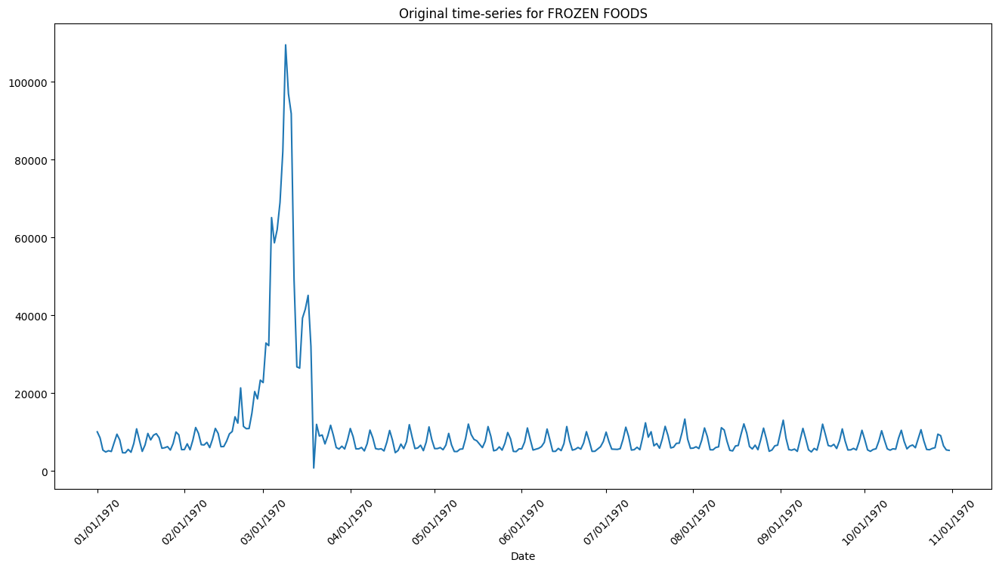

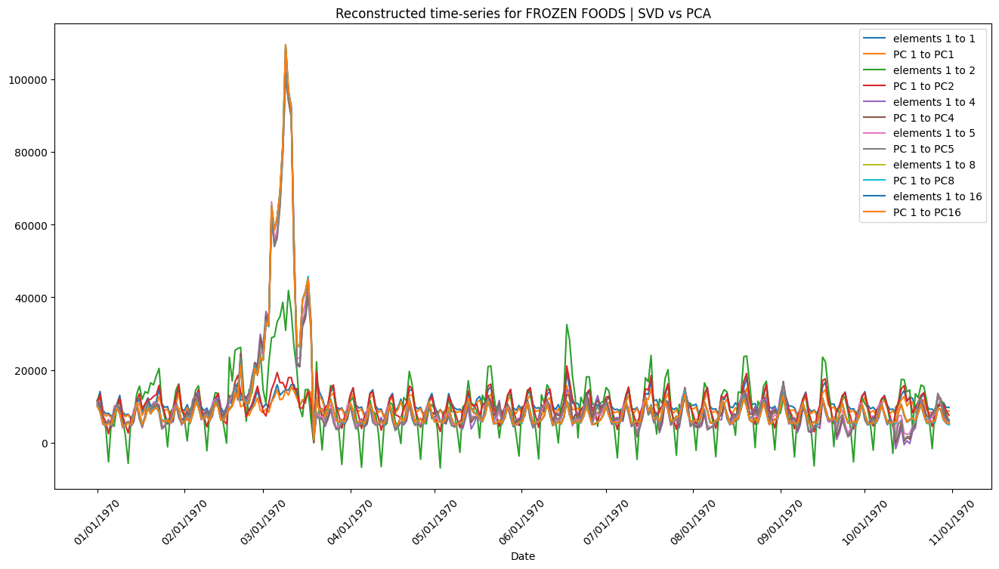

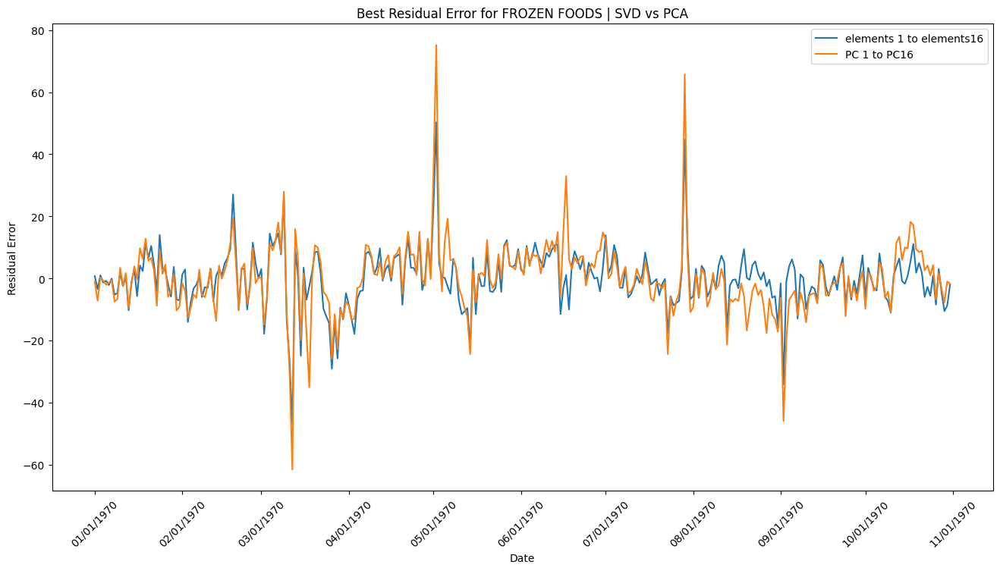

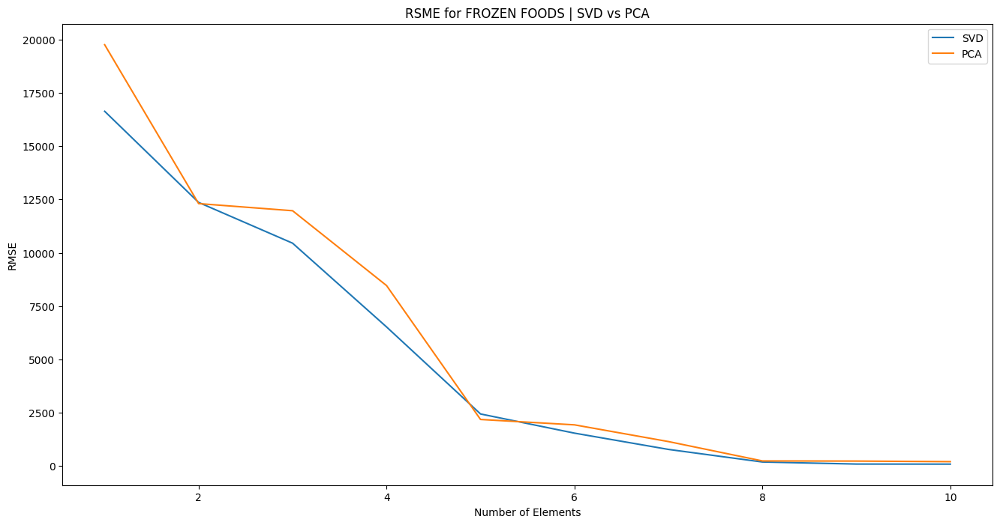

In [ ]:
SVD_PCA_CMP(data_raw, "FROZEN FOODS")

Explain if standardization or covariance computation is required for this part:

Standardization in PCA is required for the covariance matrix; however, since SVD does not use a covariance matrix, standardization for SVD is unnecessary. As can be seen from the code above, without using standardization and a covariance matrix, we were able to achieve a very good result. However, it is good practice to standardize the data for SVD es, especially if the features are on different scales, as it ensures each feature contributes equally.

Comment on the results:

In most cases, except for the first and last cases, it can be noticed that based on the RSME graphs, SVD can create better-restored data with fewer components. At the same time, as we increase the number of components (typically at around two components), the RSME of PCA significantly drops and becomes similar to SVD.

# Part 5: Let's collect another dataset! [2.5 Marks]
Create another dataset similar to the one provided in your handout using the raw information on average daily sales for different cities of Ecuador from 2015 to 2017 [here](https://github.com/Sabaae/Dataset/blob/main/AverageSalesbyCity.csv). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). Missing values were removed such that if there was a missing value for the average sales of a particular city at a given date, that date has been completely removed from the dataset, even if the data of that specific date existed for other cities.

You are free to use any tools you like, from Excel to Python! In the end, you should have a new CSV file similar to the previous dataset. How many features does the final dataset have? How many cities are there?


Upload your new dataset (in CSV format) to your colab notebook, repeat part 4 for this dataset **[1]**, and comment on the results **[0.5]**. When analyzing the cities, you may use `Manta`, `Cuenca`, `Puyo`, `Quito`, and `El Carmen`.


The code below helps you to upload your new CSV file to your colab session.

In [13]:
# load train.csv to Google Colab
from google.colab import files
uploaded = files.upload()

Saving ModAverageSalesbyCity.csv to ModAverageSalesbyCity.csv


In [37]:
### YOUR CODE HERE ###
import io
file_name = list(uploaded.keys())[0]
df_5 = pd.read_csv(io.BytesIO(uploaded[file_name]),index_col=0)
num_cities,num_features =df_5.shape
print(f"There are {num_cities} Cities & {num_features} Features")
display(df_5)

There are 21 Cities & 88 Features


,2015-10-09,2015-11-02,2015-11-03,2015-11-06,2015-11-10,2015-11-11,2015-11-12,2015-11-27,2015-11-30,2015-12-08,...,2017-05-12,2017-05-24,2017-05-26,2017-06-23,2017-07-03,2017-07-24,2017-07-25,2017-08-10,2017-08-11,2017-08-15
city,,,,,,,,,,,,,,,,,,,,,
Ambato,31542.014000,27822.312000,36191.305010,23859.468978,20300.056004,20316.693000,19744.893993,24165.201980,25661.903004,24251.895000,...,26937.050979,27009.775990,36976.897000,26296.420007,59496.756040,28180.418004,26133.407000,24809.644004,28385.367004,24250.683004
Babahoyo,11600.677000,12710.313000,17396.292990,11369.925000,12398.458010,8697.368000,8583.699000,9766.343000,11494.425000,12852.041000,...,11381.513000,8884.296000,13790.370000,11434.866990,28131.835996,12222.570020,15244.628000,10547.809990,14356.665980,15469.877000
Cayambe,21402.435000,22231.977070,26304.007960,15074.156000,16676.495000,13585.936000,13317.631000,14113.566000,16876.365960,18877.560002,...,15144.514000,16231.836000,20402.221000,18423.704010,53829.170000,18769.708900,18591.710000,18647.946990,19098.661000,21727.240000
Cuenca,42283.271000,36432.235001,41133.077000,37735.753994,34168.795990,32623.197000,25804.171996,29902.148986,34378.746004,35993.034020,...,40067.292000,37507.410001,45678.021970,38360.226000,96090.773980,44041.960010,43246.158000,35612.462005,31420.124004,35793.972976
Daule,13496.379000,13666.855980,20319.285000,9503.860999,10714.570000,12459.297000,10064.095996,11258.719000,14520.076100,10984.482000,...,12904.447010,14684.347000,18390.463999,12653.391000,33377.898000,21019.854000,13775.681880,10164.649996,16296.346016,13377.979000
El Carmen,6885.082000,6738.319000,9493.984000,6310.517000,5816.941000,4827.264000,3995.906000,6310.106000,7506.232004,6859.560000,...,10852.887001,7398.540000,8658.114000,8752.575998,16110.150000,10245.246998,8241.906000,9757.816000,8513.834000,12666.858000
Esmeraldas,11227.911000,12568.154000,14271.258000,9793.129996,10186.844000,8659.104000,8634.872000,9270.106995,11533.167000,11315.572980,...,10905.173000,10541.091000,16890.726000,13147.452000,34130.026000,19890.556000,16784.556900,14396.110000,16143.667010,15368.844000
Guaranda,9233.783990,9192.703000,12809.372000,7548.881995,7402.327000,7839.970000,8125.996000,7243.661000,9275.816000,7530.169040,...,9097.972000,6910.838000,9850.477000,7011.985000,20518.218000,9849.937002,7982.132996,7548.927990,9447.868000,9282.187000
Guayaquil,79799.711998,74698.369978,107665.957025,76025.786979,75140.080092,80955.240022,61977.716948,71552.167014,88884.357953,90434.590000,...,91809.729878,87530.682217,106471.622015,88567.186004,205639.769996,100569.026013,87021.361990,70987.349006,96893.858000,101063.805991


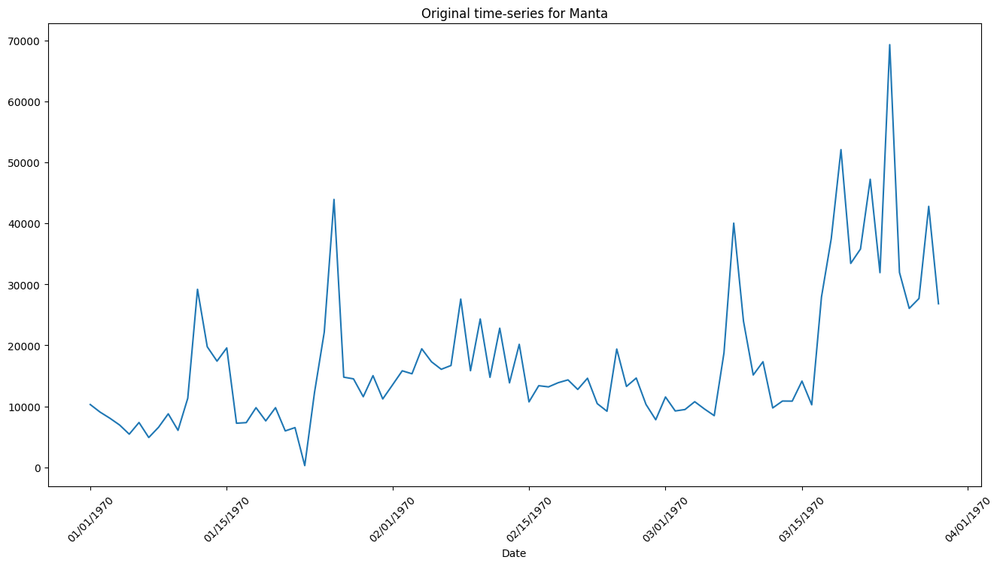

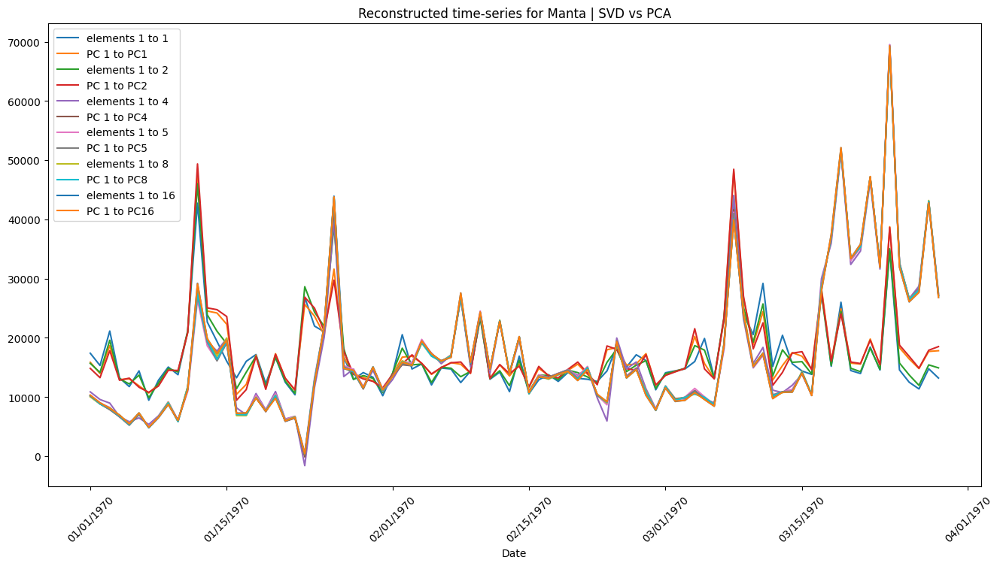

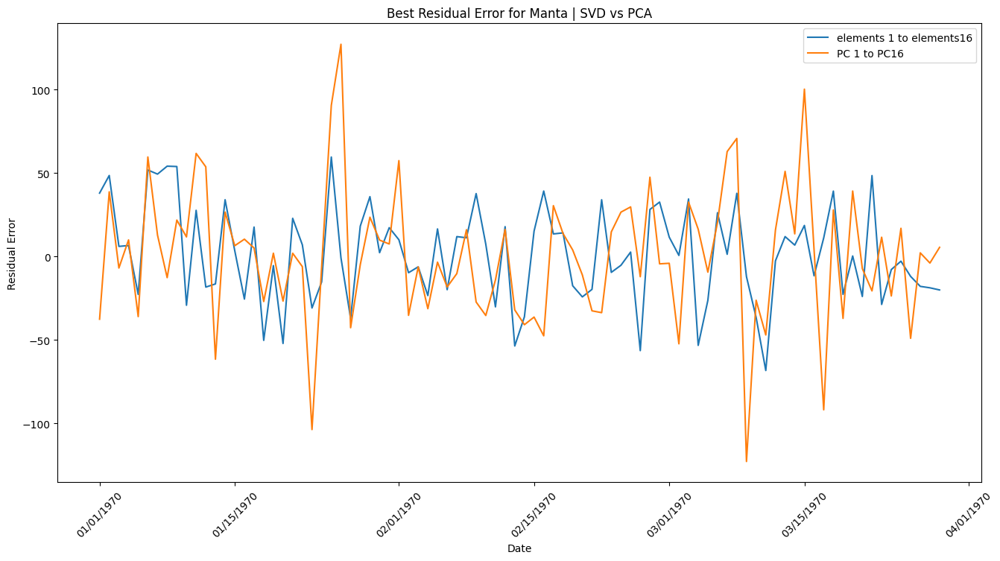

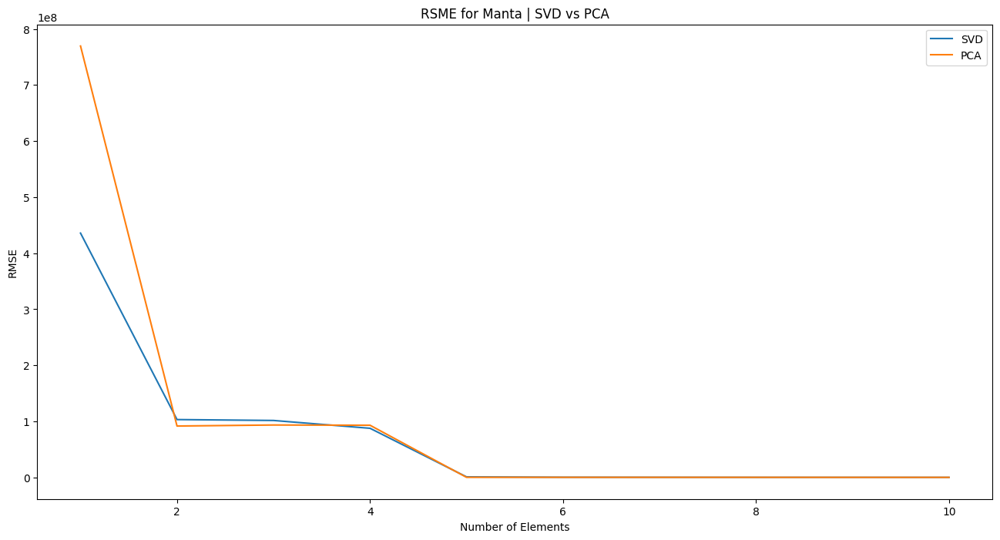

In [28]:
SVD_PCA_CMP(df_5, "Manta")

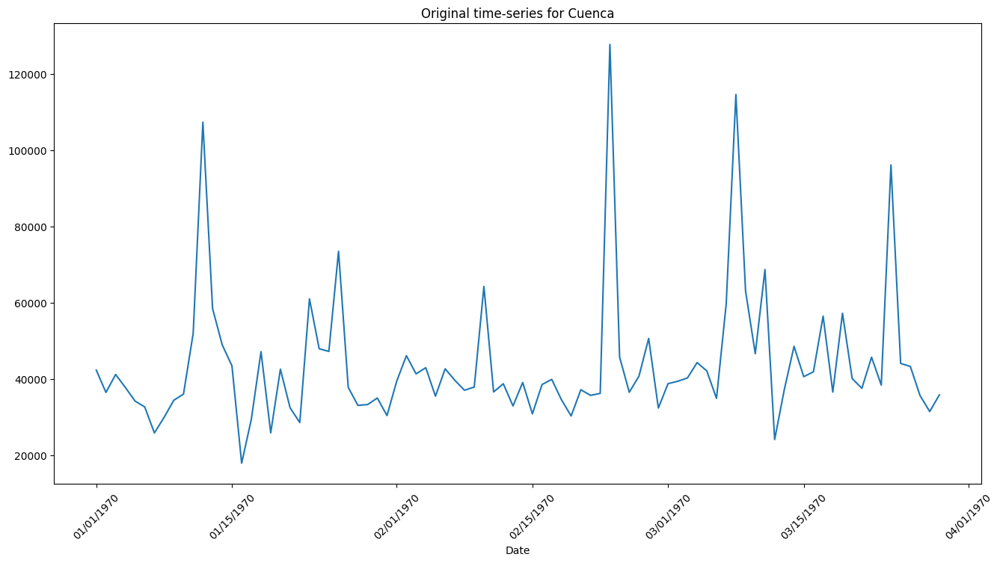

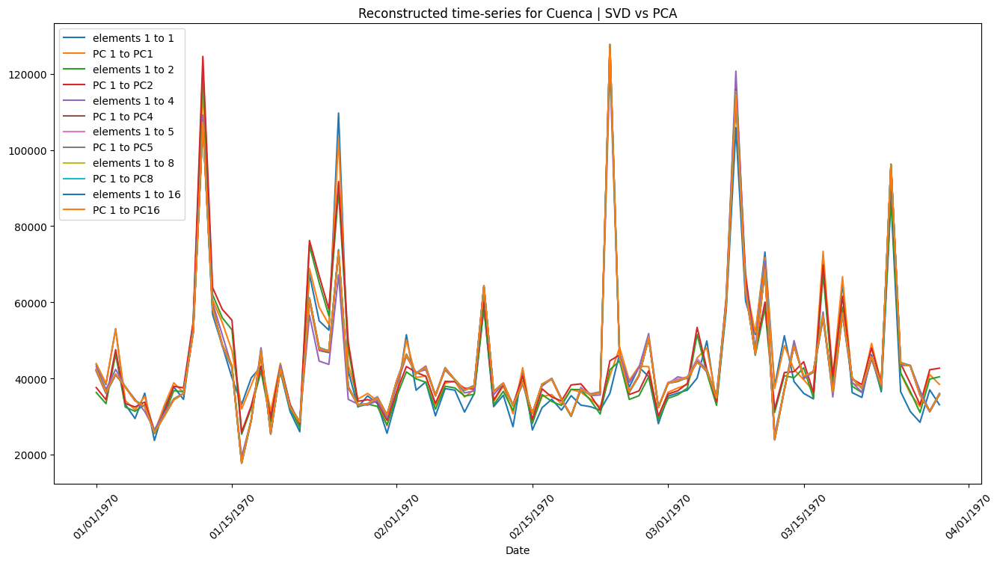

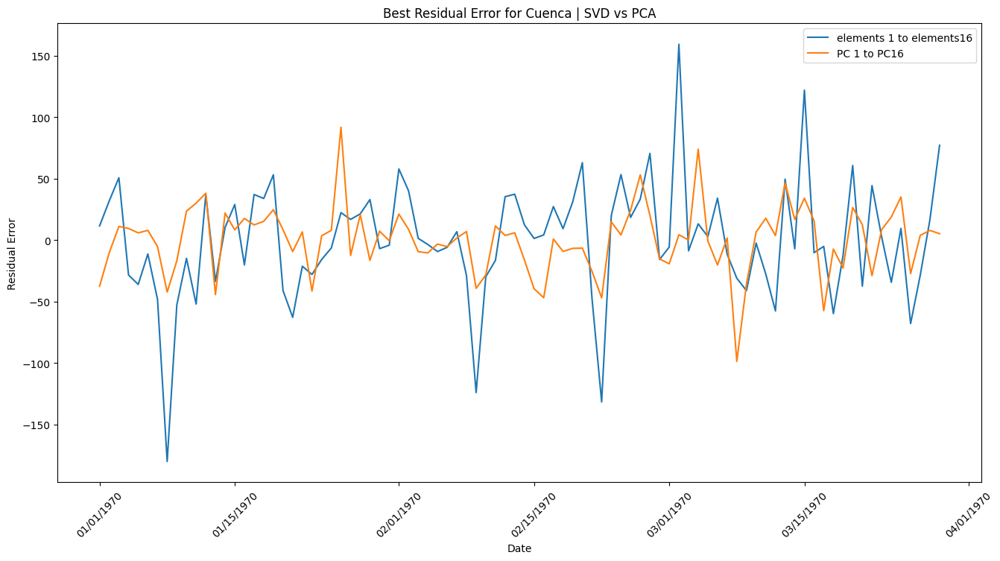

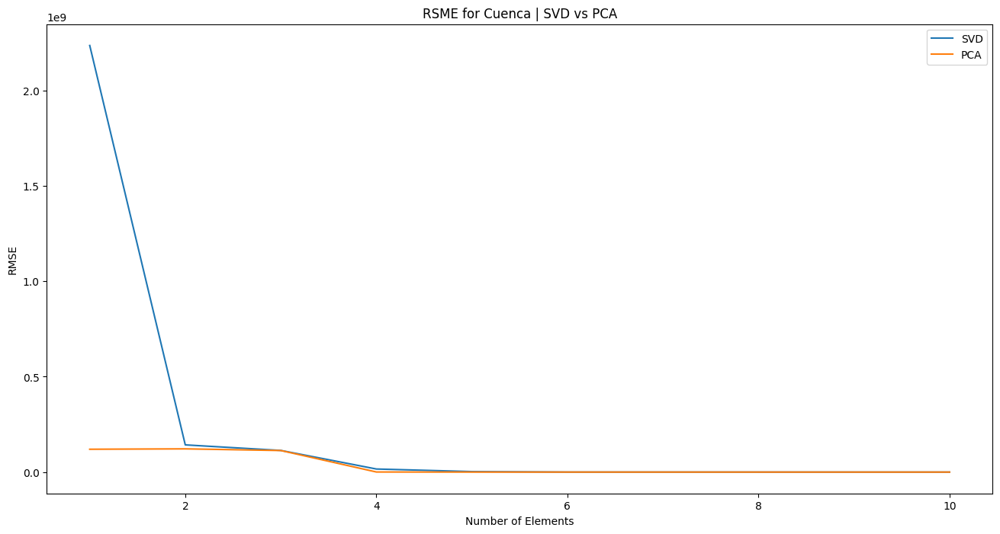

In [29]:
SVD_PCA_CMP(df_5, "Cuenca")

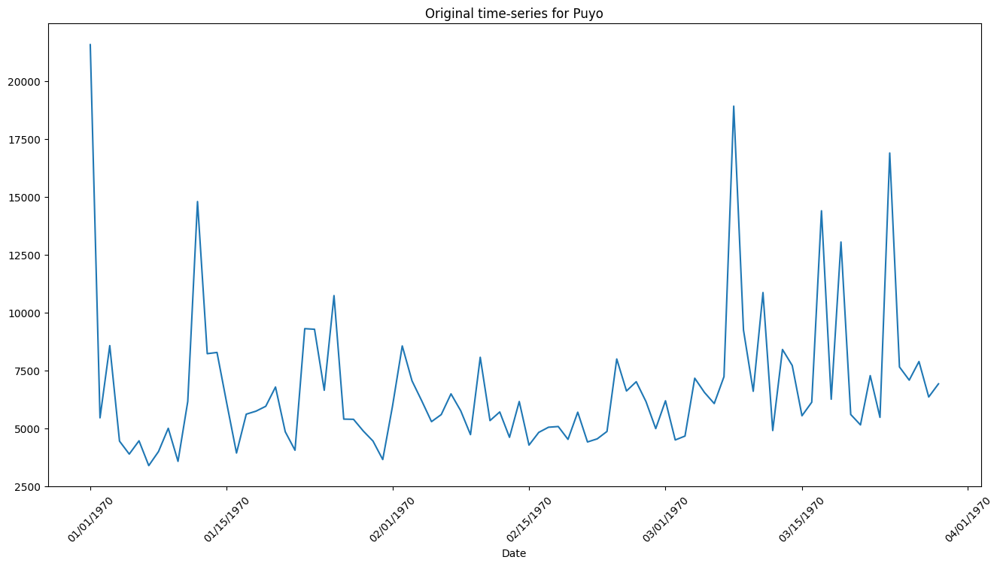

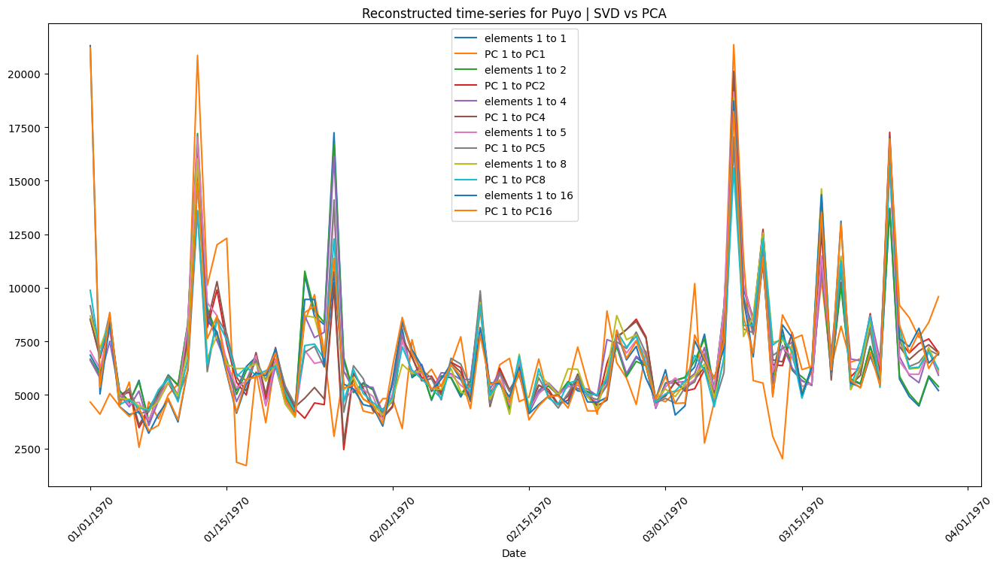

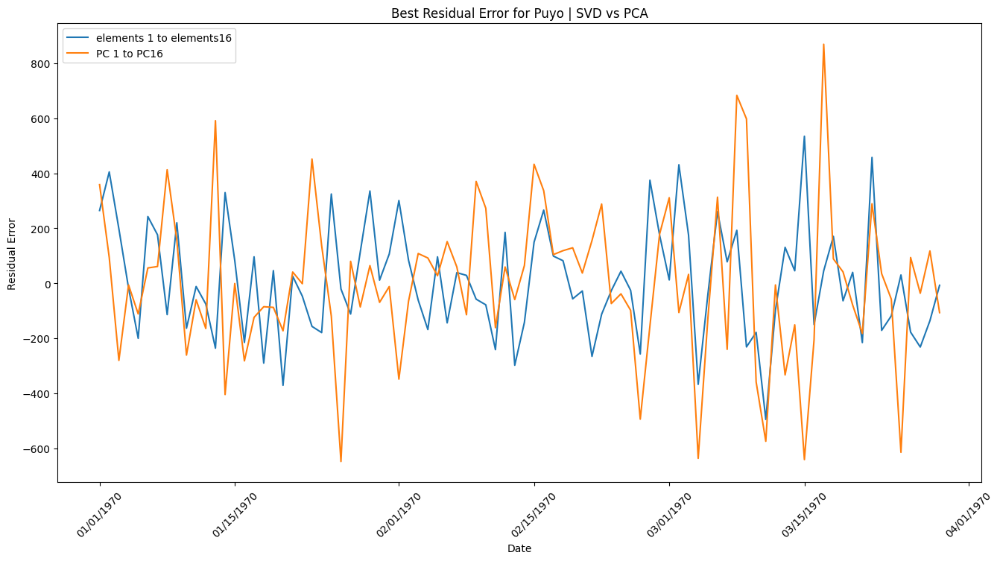

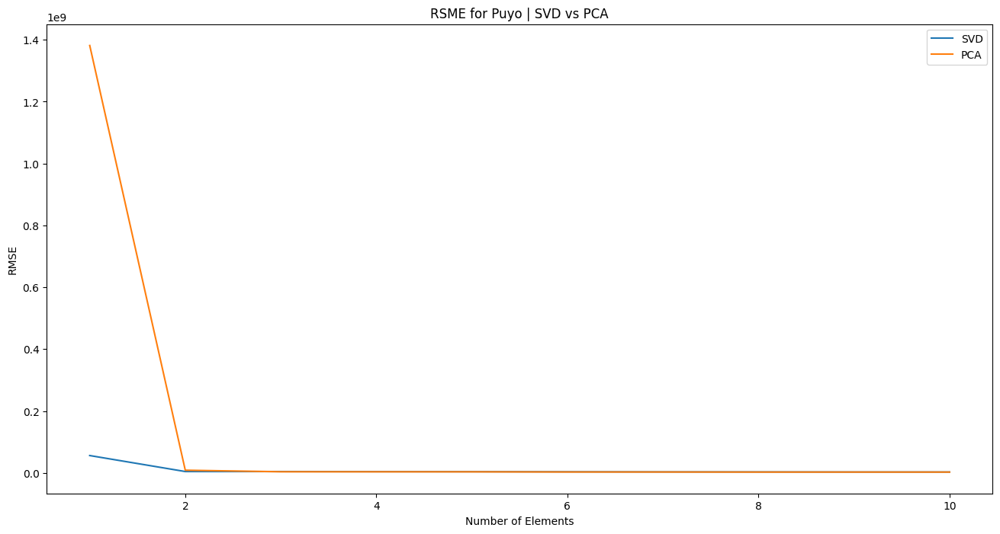

In [30]:
SVD_PCA_CMP(df_5, "Puyo")

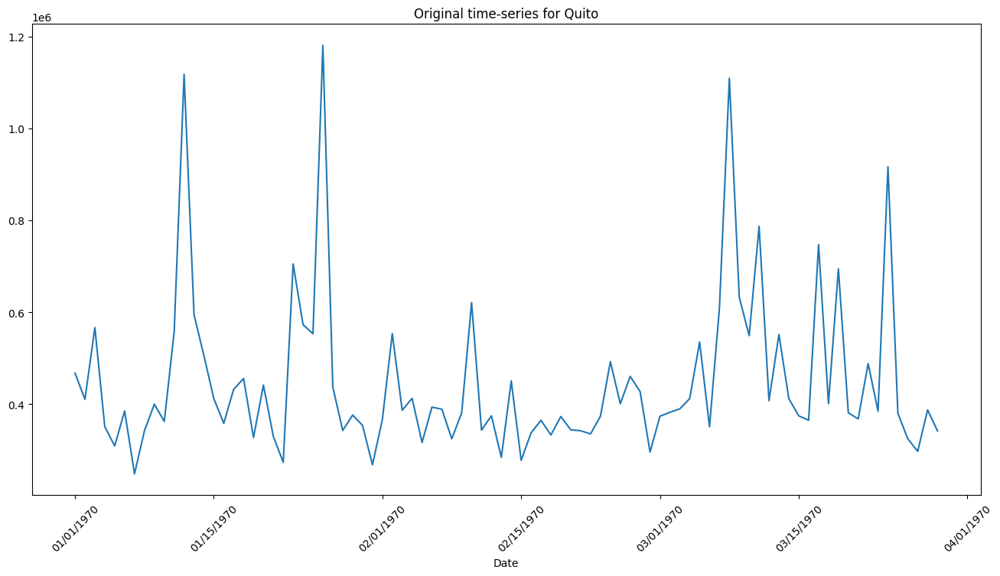

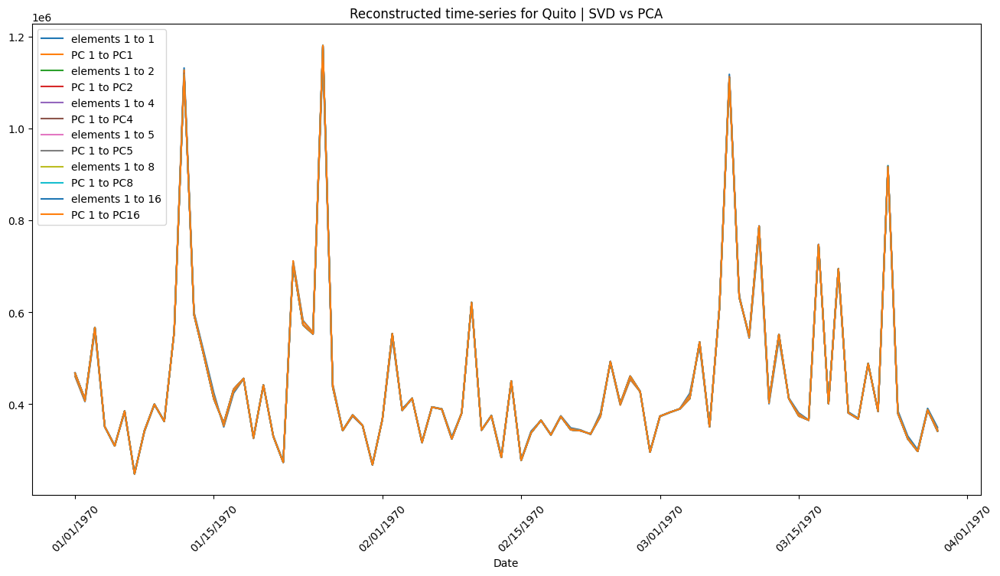

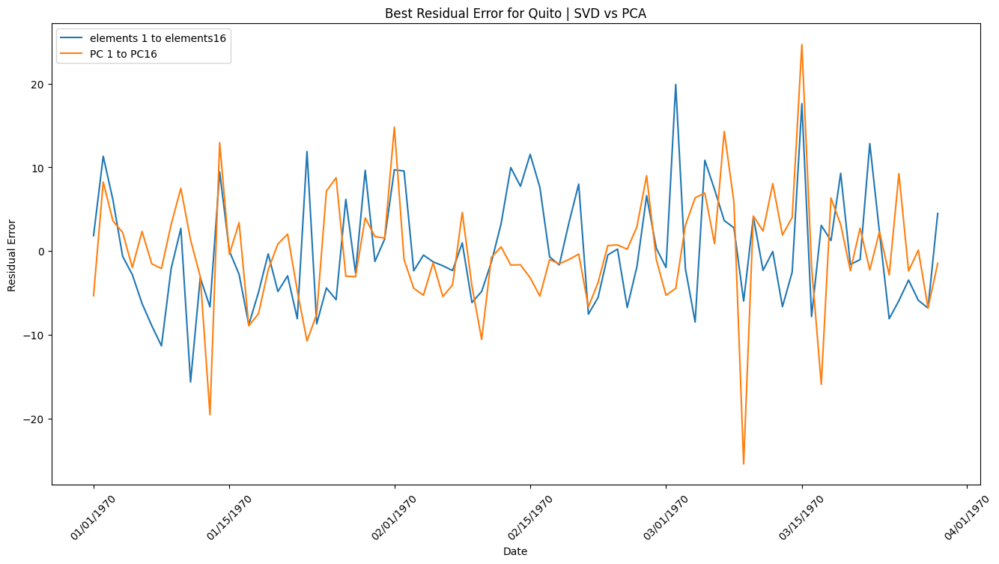

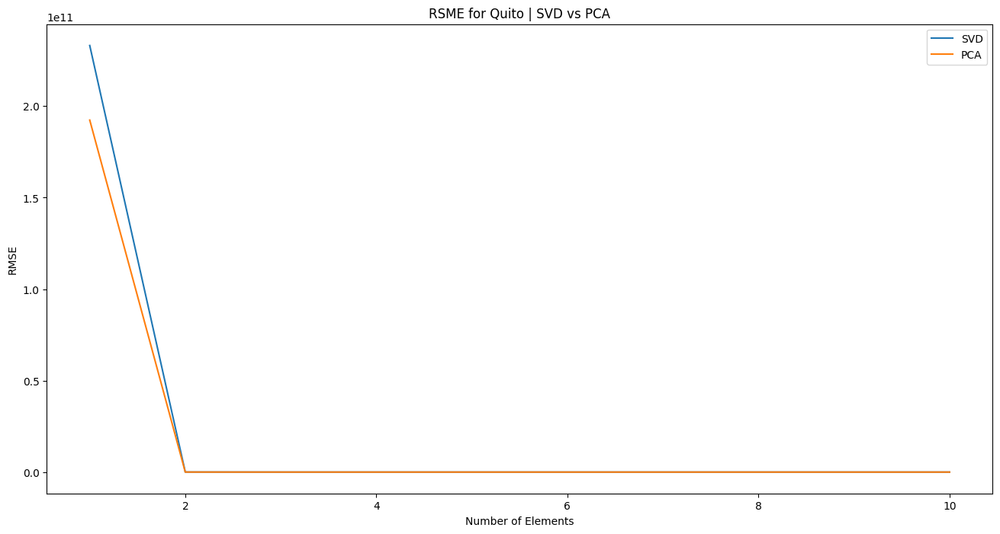

In [31]:
SVD_PCA_CMP(df_5, "Quito")

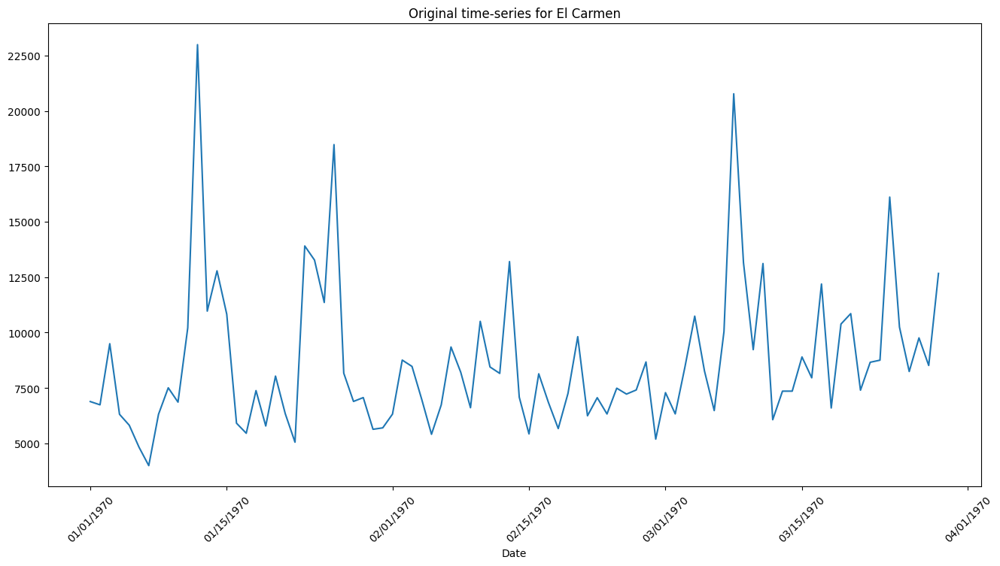

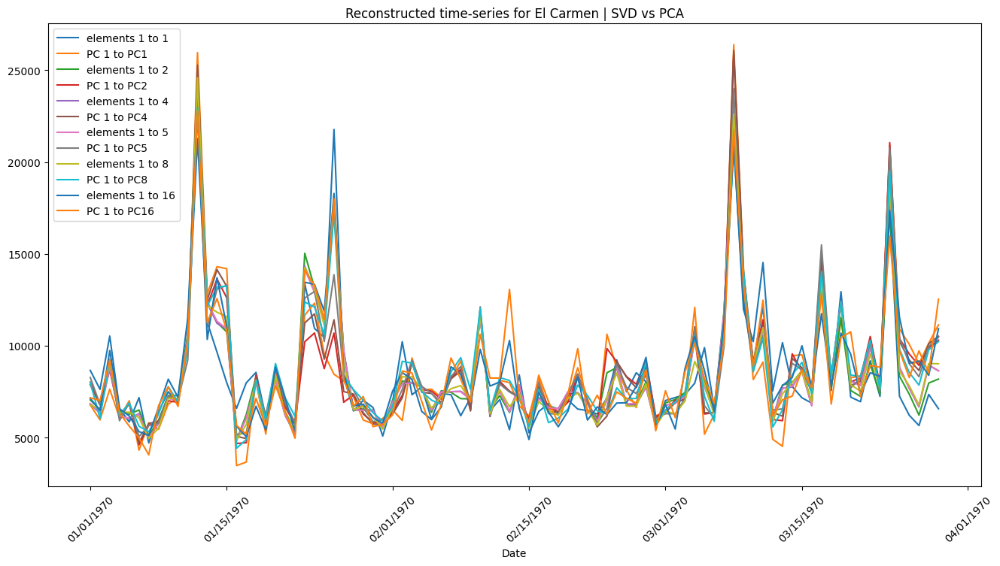

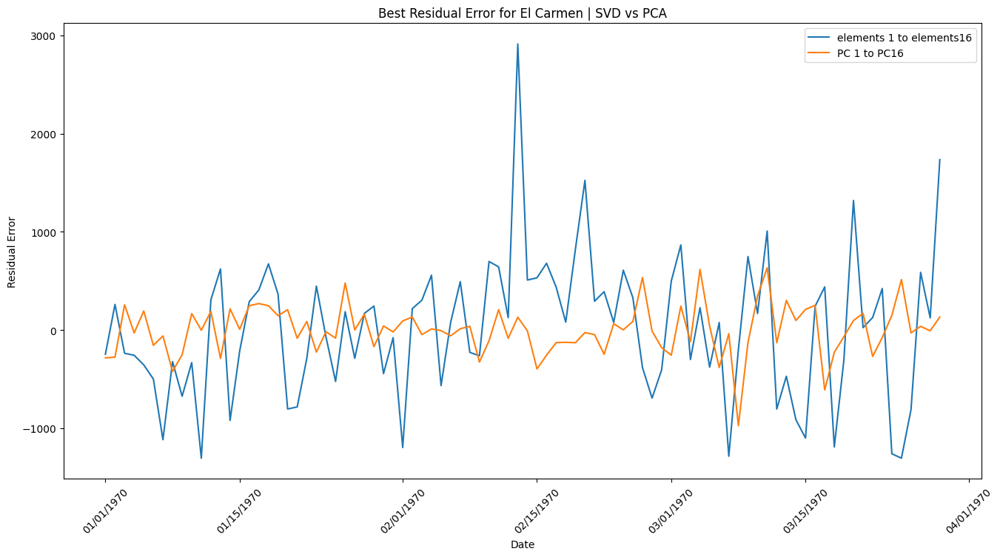

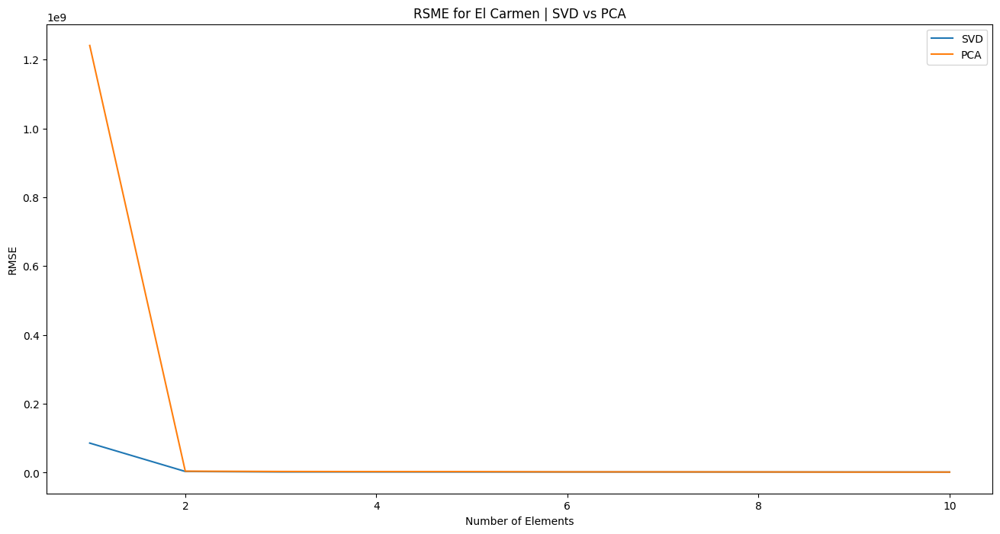

In [32]:
SVD_PCA_CMP(df_5, "El Carmen")

comment on the results

The results observed here are slightly different compared to the previous dataset. To begin with, the RSMEs of this dataset are significantly less than those of the previous one. Secondly, SVD didn't dominate the performance this time; with Manta, Puyo, and EL Carmen, SVD performed better, while with Cuenca and Quito, PCA performed better. However, given the low values of the residual errors, the data performed very well in reconstruction. This could be attributed to this dataset's lower number of features or higher data correlation.

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Sales Data:

1. https://www.kaggle.com/competitions/store-sales-time-series-forecasting/data

